# WQD7003 Group Assignment
##Title: Prediction of Tertiary Education Student Dropout
---
Group 6 members:

*   Chan Jie Min (s2141167)
*   Emily Sia Zi Xuan (17205326)
*   Ang Qi Kang (17205824)
*   Timothy Chen Xian Yii (22056170)
*   Chen Yi (22079565)




##CRISP-DM Methodology

1.   Business understanding – What does the business need?
2.   Data understanding – What data do we have / need? Is it clean?
3.   Data preparation – How do we organize the data for modeling?
4.   Modeling – What modeling techniques should we apply?
5.   Evaluation – Which model best meets the business objectives?
6.   Deployment – How do stakeholders access the results?


# 1.   Business understanding



Background

*   School dropout can be defined as students being absent from school for no valid reason for a continuous number of days. This has become a rising concern for societies across the world as those with higher education generally live healthier lives.
*   As such, there is the need for educators to understand the underlying root causes of school dropout and academic success in order to improve education quality or provide early intervention.
*   Using machine learning methods, it can be possible to identfy these characteristics and provide early warning signs of whether a student will graduate or dropout.

Business Objectives:
*   To identify the factors that influence the students performance
*   To predict the student dropout and academic success

#2. Data understanding

##2.1 Data source
*  This dataset is available on the UCI Machine Learning Repository.
*  It contains student data taken from various sources within a single tertiary education institute from 17 undergraduate programs, such as agronomy, design, education, nursing, journalism, management, social service, and technologies.
*   Collected from 2008/2009 to 2018/2019, this includes students' personal information as well as their academic results.
*   By the end of the course, the three possible outcomes are enrolled, dropout or graduate.

*   The dataset has a total of 4424 observations with 37 attributes.


| Class | Attribute | Type |
|---|---|---|
| Demographic data | Marital status<br>Nationality<br>Displaced<br>Gender<br>Age at enrollment<br>International | Numeric/discrete<br>Numeric/discrete<br>Numeric/binary<br>Numeric/binary<br>Numeric/discrete<br>Numeric/binary |
| Socioeconomic data | Mother's qualification<br>Father's qualification<br>Mother's occupation<br>Father's occupation<br>Educational special needs<br>Debtor<br>Tuition fees up to date<br>Scholarship holder | Numeric/discrete<br>Numeric/discrete<br>Numeric/discrete<br>Numeric/discrete<br>Numeric/binary<br>Numeric/binary<br>Numeric/binary<br>Numeric/binary |
| Socioeconomic data | Unemployment rate<br>Inflation rate<br>GDP | Numeric/continuous<br>Numeric/continuous<br>Numeric/continuous |
| Academic data (enrollment) | Application mode<br>Application order<br>Course<br>Daytime/evening attendance<br>Previous qualification | Numeric/discrete<br>Numeric/ordinal<br>Numeric/discrete<br>Numeric/binary<br>Numeric/discrete |
| Academic data (1st semester) | Curricular units 1st sem (credited)<br>Curricular units 1st sem (enrolled)<br>Curricular units 1st sem (evaluations)<br>Curricular units 1st sem (approved)<br>Curricular units 1st sem (grade)<br>Curricular units 1st sem (without evaluations) | Numeric/discrete<br>Numeric/discrete<br>Numeric/discrete<br>Numeric/discrete<br>Numeric/continuous<br>Numeric/discrete |
| Academic data (2nd semester) | Curricular units 2nd sem (credited)<br>Curricular units 2nd sem (enrolled)<br>Curricular units 2nd sem (evaluations)<br>Curricular units 2nd sem (approved)<br>Curricular units 2nd sem (grade)<br>Curricular units 2nd sem (without evaluations) | Numeric/discrete<br>Numeric/discrete<br>Numeric/discrete<br>Numeric/discrete<br>Numeric/continuous<br>Numeric/discrete |
| Target | Target (Enrolled/ Dropout/ Graduate) | Categorical |

In [ ]:
#Load in dataset

# Import libraries
import pandas as pd
import numpy as np

# To mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Set path of dataset
#dataset_path = '/content/drive/My Drive/7003/data.csv'
dataset_path = '/content/data.csv'

df = pd.read_csv(dataset_path, sep=';')
#df = pd.read_csv("data.csv",sep=';')
#df.head()

Mounted at /content/drive


In [ ]:
# Check number of rows
num_rows = len(df)[]
# Check number of columns
num_columns = len(df.columns)

print("Number of observations (including labels):", num_rows)
print("Number of attributes:", num_columns)

Number of observations (including labels): 4424
Number of attributes: 37


The number of observations and attributes match those as listed from the UCI Machine Learning Repository. As a first step, this information helps in verifying the dataset is as stated.

In [ ]:
# Unique values for each attribute
unique_values = {}
for column in df.columns:
    unique_values[column] = df[column].unique()

for column, values in unique_values.items():
    print(f"Unique values:'{column}':")
    print(values)
    print()

Unique values:'Marital status':
[1 2 4 3 5 6]

Unique values:'Application mode':
[17 15  1 39 18 53 44 51 43  7 42 16  5  2 10 57 26 27]

Unique values:'Application order':
[5 1 2 4 3 6 9 0]

Unique values:'Course':
[ 171 9254 9070 9773 8014 9991 9500 9238 9670 9853 9085 9130 9556 9147
 9003   33 9119]

Unique values:'Daytime/evening attendance	':
[1 0]

Unique values:'Previous qualification':
[ 1 19 42 39 10  3 40  2  4 12 43 15  6  9 38  5 14]

Unique values:'Previous qualification (grade)':
[122.  160.  100.  133.1 142.  119.  137.  138.  139.  136.  133.  110.
 149.  127.  135.  140.  125.  126.  151.  115.  150.  143.  130.  120.
 103.  154.  132.  167.  129.  141.  116.  148.  118.  106.  121.  114.
 124.  123.  113.  111.  131.  158.  146.  117.  153.  178.   99.  134.
 128.  170.  155.  145.  152.  112.  107.  156.  188.   96.  161.  166.
 147.  144.  102.  101.  180.  172.  105.  108.  165.  190.  162.  164.
 163.  159.  117.4 175.  133.8 176.  168.  139.3  97.  157.  140.8 18

In [ ]:
# Total number of unique values for each attribute
unique_counts = df.nunique()

# Print
for attribute, count in unique_counts.items():
    print(f"{attribute}: {count}")

Marital status: 6
Application mode: 18
Application order: 8
Course: 17
Daytime/evening attendance	: 2
Previous qualification: 17
Previous qualification (grade): 101
Nacionality: 21
Mother's qualification: 29
Father's qualification: 34
Mother's occupation: 32
Father's occupation: 46
Admission grade: 620
Displaced: 2
Educational special needs: 2
Debtor: 2
Tuition fees up to date: 2
Gender: 2
Scholarship holder: 2
Age at enrollment: 46
International: 2
Curricular units 1st sem (credited): 21
Curricular units 1st sem (enrolled): 23
Curricular units 1st sem (evaluations): 35
Curricular units 1st sem (approved): 23
Curricular units 1st sem (grade): 805
Curricular units 1st sem (without evaluations): 11
Curricular units 2nd sem (credited): 19
Curricular units 2nd sem (enrolled): 22
Curricular units 2nd sem (evaluations): 30
Curricular units 2nd sem (approved): 20
Curricular units 2nd sem (grade): 786
Curricular units 2nd sem (without evaluations): 10
Unemployment rate: 10
Inflation rate: 9
GD

In [ ]:
#Descriptive statistics (all 37 attributes)
pd.set_option('display.max_columns', None)
df.describe()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,Mother's occupation,Father's occupation,Admission grade,Displaced,Educational special needs,Debtor,Tuition fees up to date,Gender,Scholarship holder,Age at enrollment,International,Curricular units 1st sem (credited),Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP
count,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000
mean,1.178571,18.669078,1.727848,8856.642631,0.890823,4.577758,132.613314,1.873192,19.561935,22.275316,10.960895,11.032324,126.978119,0.548373,0.011528,0.113698,0.880651,0.351718,0.248418,23.265145,0.024864,0.709991,6.270570,8.299051,4.706600,10.640822,0.137658,0.541817,6.232143,8.063291,4.435805,10.230206,0.150316,11.566139,1.228029,0.001969
std,0.605747,17.484682,1.313793,2063.566416,0.311897,10.216592,13.188332,6.914514,15.603186,15.343108,26.418253,25.263040,14.482001,0.497711,0.106760,0.317480,0.324235,0.477560,0.432144,7.587816,0.155729,2.360507,2.480178,4.179106,3.094238,4.843663,0.690880,1.918546,2.195951,3.947951,3.014764,5.210808,0.753774,2.663850,1.382711,2.269935
min,1.000000,1.000000,0.000000,33.000000,0.000000,1.000000,95.000000,1.000000,1.000000,1.000000,0.000000,0.000000,95.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.600000,-0.800000,-4.060000
25%,1.000000,1.000000,1.000000,9085.000000,1.000000,1.000000,125.000000,1.000000,2.000000,3.000000,4.000000,4.000000,117.900000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,19.000000,0.000000,0.000000,5.000000,6.000000,3.000000,11.000000,0.000000,0.000000,5.000000,6.000000,2.000000,10.750000,0.000000,9.400000,0.300000,-1.700000
50%,1.000000,17.000000,1.000000,9238.000000,1.000000,1.000000,133.100000,1.000000,19.000000,19.000000,5.000000,7.000000,126.100000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,20.000000,0.000000,0.000000,6.000000,8.000000,5.000000,12.285714,0.000000,0.000000,6.000000,8.000000,5.000000,12.200000,0.000000,11.100000,1.400000,0.320000
75%,1.000000,39.000000,2.000000,9556.000000,1.000000,1.000000,140.000000,1.000000,37.000000,37.000000,9.000000,9.000000,134.800000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,25.000000,0.000000,0.000000,7.000000,10.000000,6.000000,13.400000,0.000000,0.000000,7.000000,10.000000,6.000000,13.333333,0.000000,13.900000,2.600000,1.790000
max,6.000000,57.000000,9.000000,9991.000000,1.000000,43.000000,190.000000,109.000000,44.000000,44.000000,194.000000,195.000000,190.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,70.000000,1.000000,20.000000,26.000000,45.000000,26.000000,18.875000,12.000000,19.000000,23.000000,33.000000,20.000000,18.571429,12.000000,16.200000,3.700000,3.510000


Identifying the number of unique values and summary statistics for each attribute helps in not just getting a feel of the dataset, but also checks it for possible outliers.

##2.2 Exploratory data analysis

In this section, data visualisation is performed on the dataset to gain a better understanding of its structure, quality, and relationships between variables.

The analyses conducted can be grouped into the following types:
*   univariate - Each attribute is visualised individually to identify possible outliers and from the norm or missing values. This also helps the data scientist to gain a better understanding of each attribute in regards to the distribution and balance of each attribute.
*   bivariate - The relationship between each attribute and the target attribute is shown to see how each atrtribute affects whether a student drops out or graduates.
*   multivariate - Certain attributes can be grouped together based on domain knowledge to obtain interesting observations from the dataset. Additionally, the collinearity of the atrtibutes are also calculated and displayed on a heatmap for the purpose of dimensionality reduction.


As a result of these anlyses, data quality issues that will negatively affect results during the modelling portion can be identified. These include issues such as:
*   imbalanced target - Certain models are sensitive to an imbalanced target, such as Decision Trees and Random Forest. Thus, if identified, oversampling or undersampling should also be included in the modelling portion.
*   collinearity - Due to the large amount of attributes in the existing dataset, it is important to remove any attributes that are repetitive. This is important to prevent computational inefficiencies, especially when models become large and complex.
*   missing data - Missing data can be represented in many ways, including the value '0'. It should be determined whether these values are actually missing or do they represent zero numerically. Missing data can be replaced through imputed based on various methods depending on the dataset. If a dataset has enough observations, it may even be more prudent to remove observations entirely if there are many missing attributes.
*   formatting inconsistencies - These could occur during the data entry process of data collection and result in skewed results if left unhandled.
*   numerical outliers - Certain models are very sensitive to numerical outliers, such as the KNN, logistics regression, linear regression, and SVM. As such, the outliers should be identified to determine their relevancy. Methods of handling outliers may be removal of the observation if it is due to error, capping based on quantile, or even imputation based on statistical means.

###2.2.1 Univariate analysis- Bar graphs

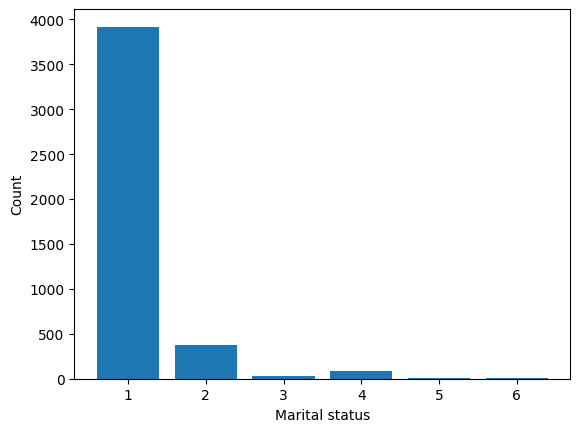

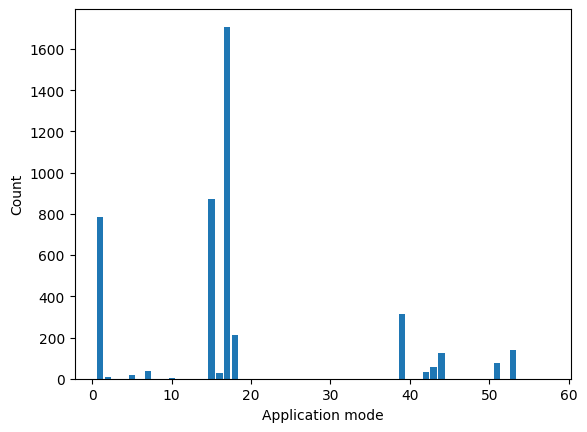

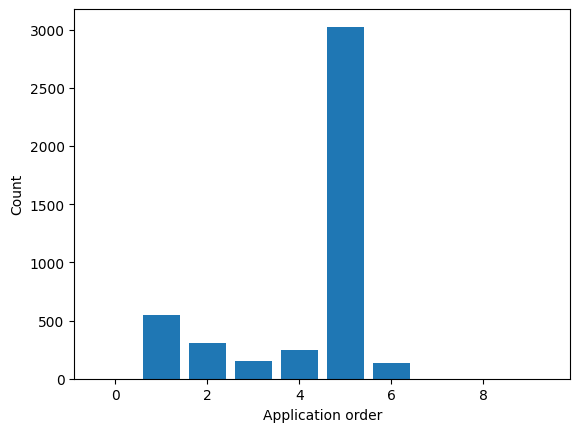

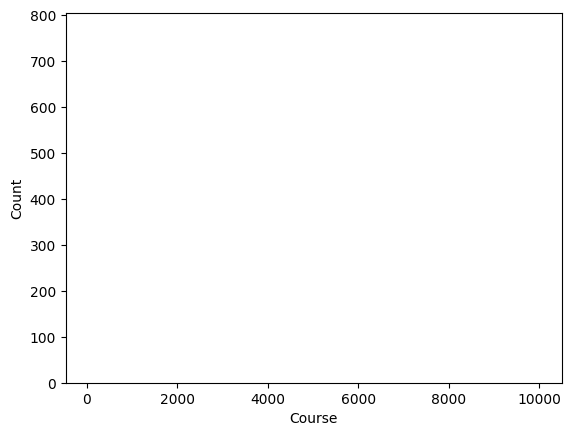

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


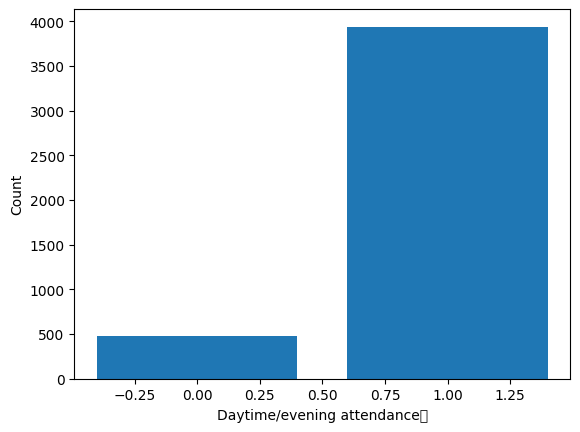

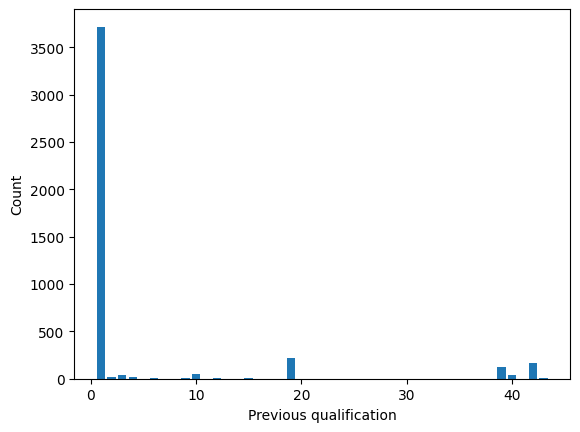

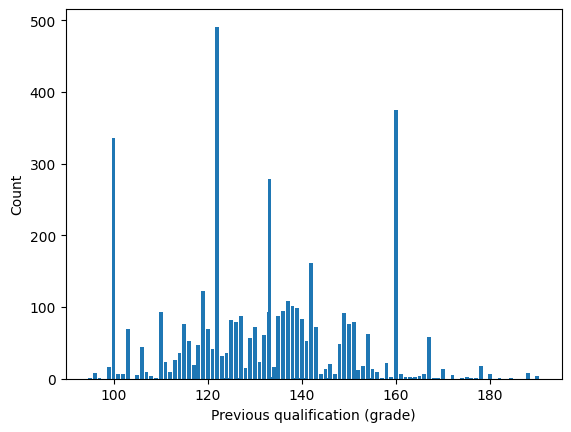

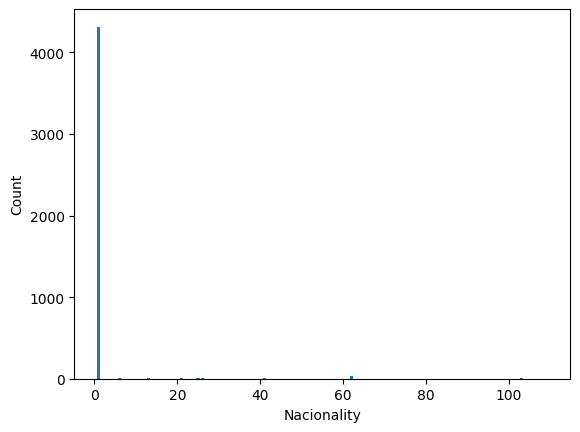

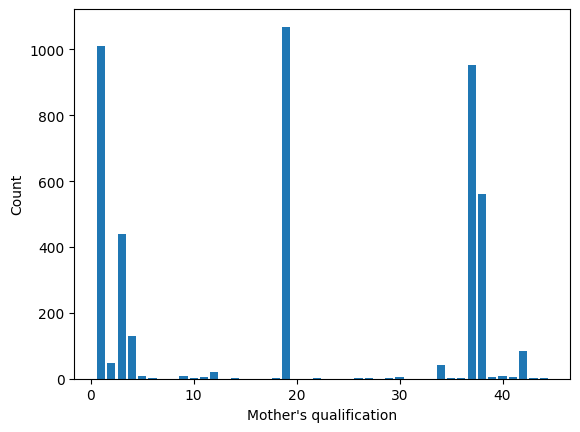

...

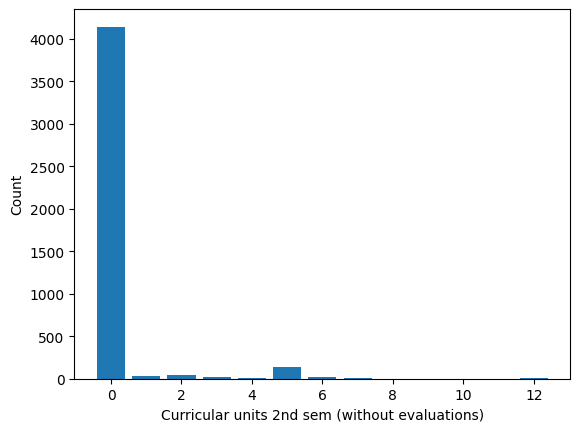

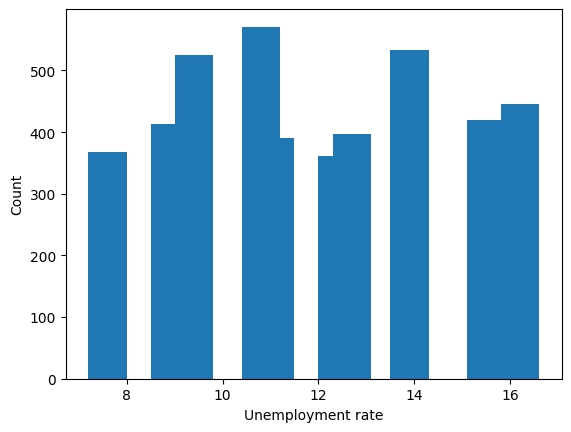

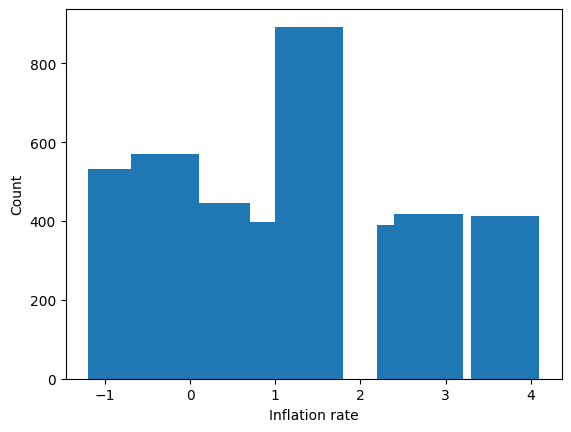

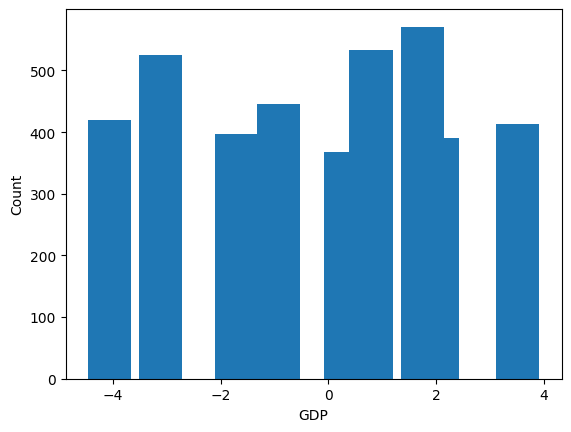

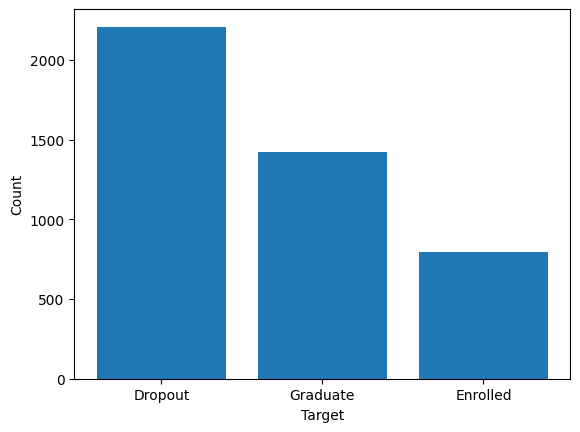

In [ ]:
#univariate
import matplotlib.pyplot as plt

# Create a bar graph for each attribute
for column in df.columns:
    plt.bar(df[column].unique(), df[column].value_counts())
    plt.xlabel(column)
    plt.ylabel("Count")
    plt.show()

**evaluation for each graph**

###2.2.1.2 Univariate analysis- Box & whisker diagrams

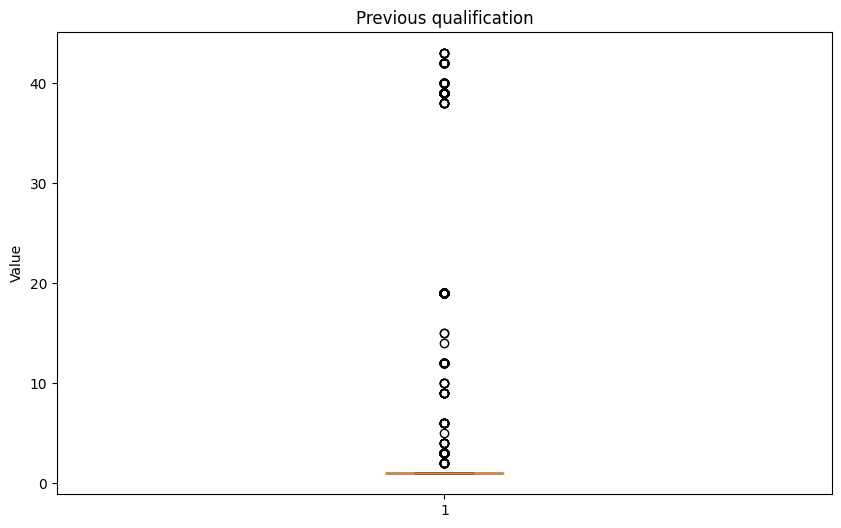

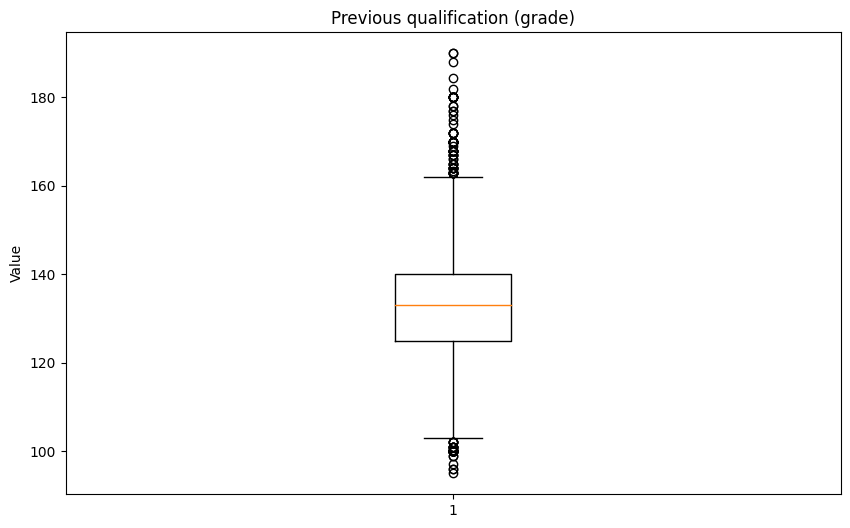

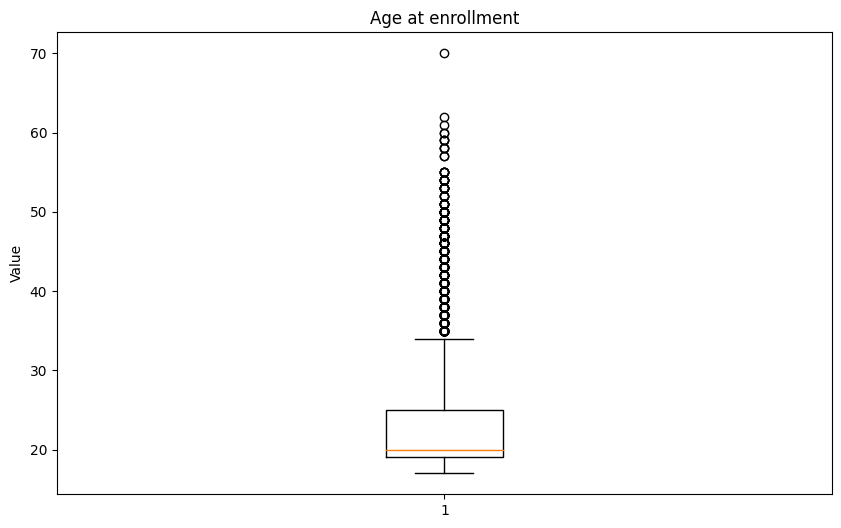

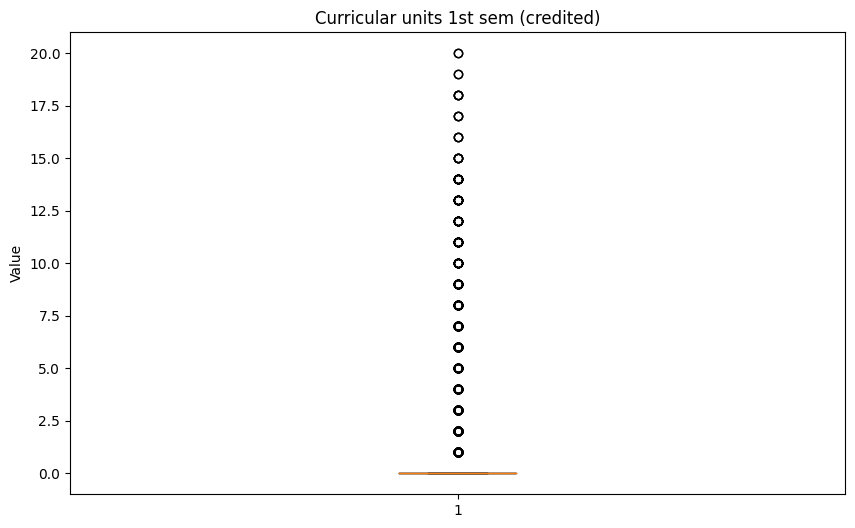

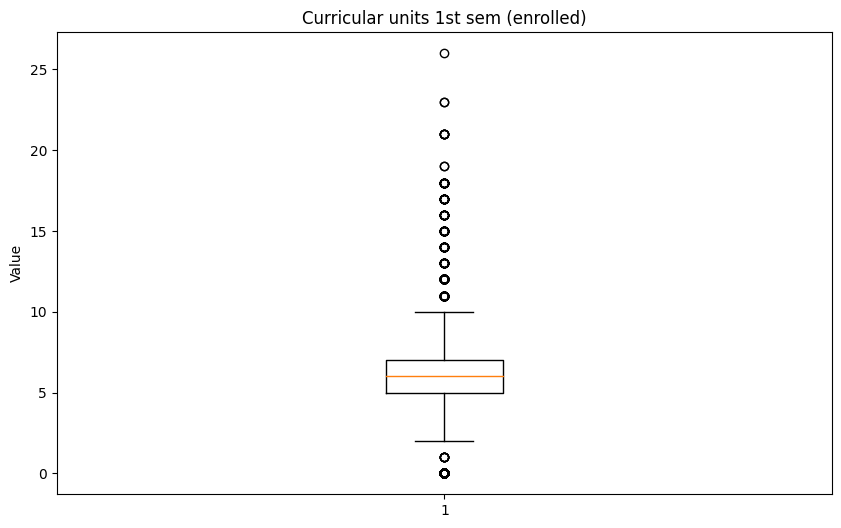

...

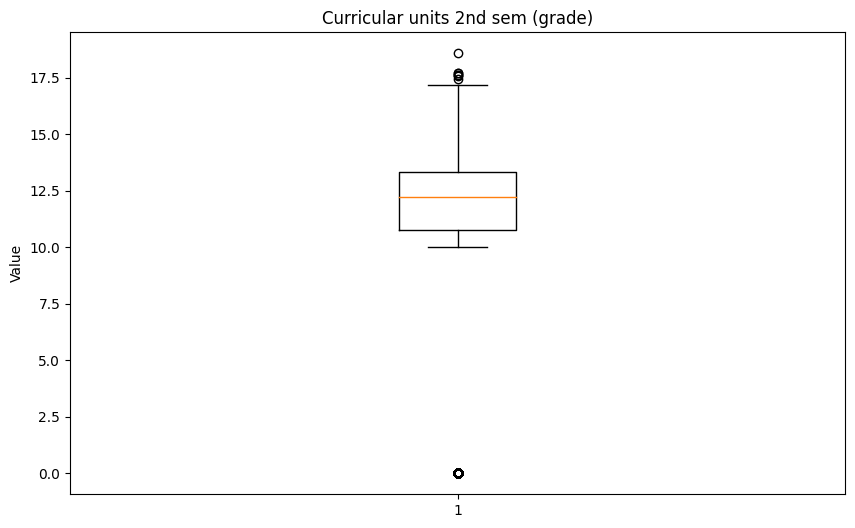

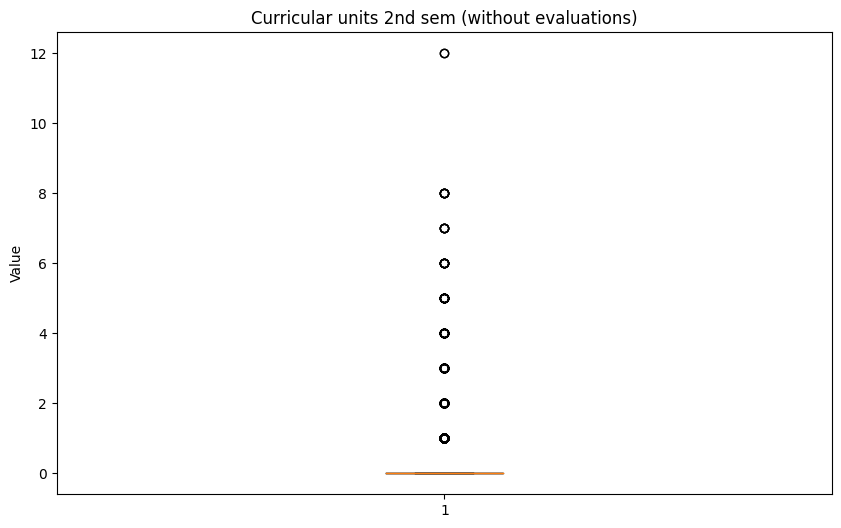

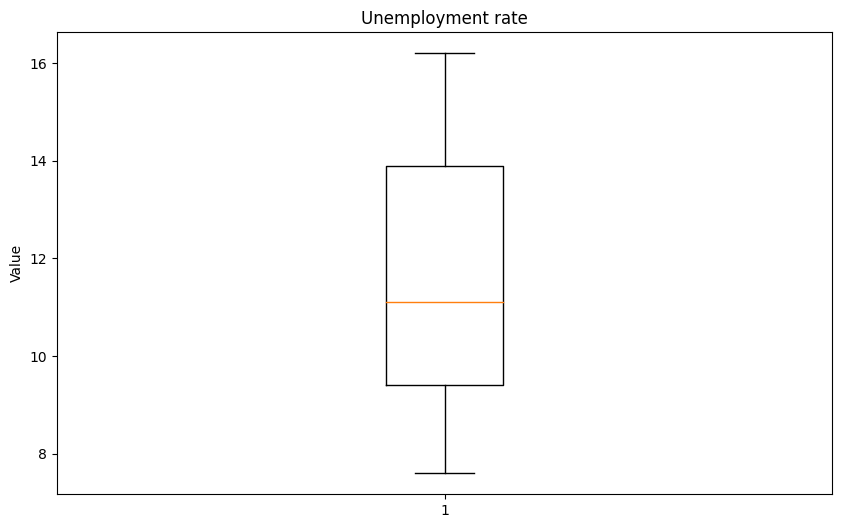

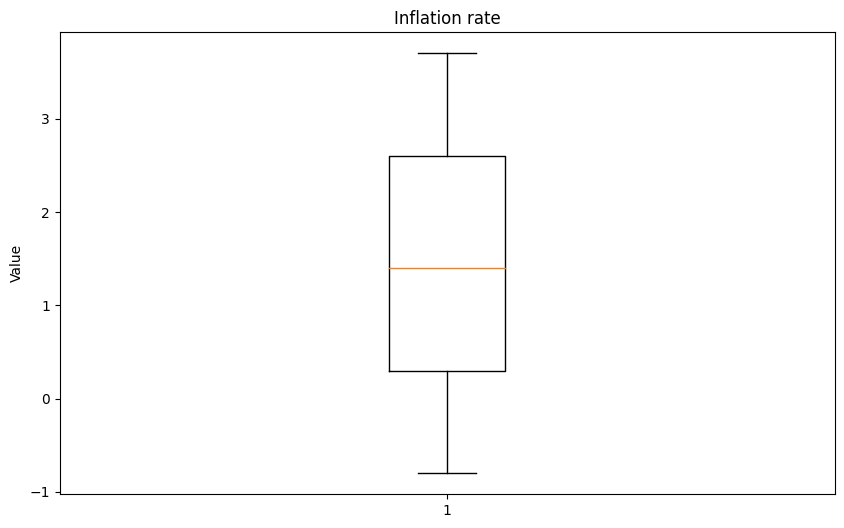

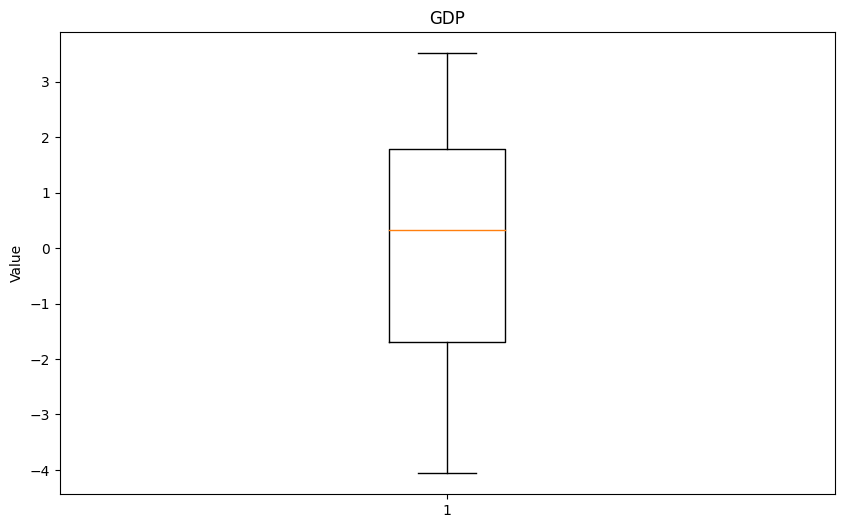

In [ ]:
import pandas as pd

# Select the variables for the boxplot
variables = ['Previous qualification', 'Previous qualification (grade)', 'Age at enrollment',
             'Curricular units 1st sem (credited)', 'Curricular units 1st sem (enrolled)',
             'Curricular units 1st sem (evaluations)', 'Curricular units 1st sem (approved)',
             'Curricular units 1st sem (grade)', 'Curricular units 1st sem (without evaluations)',
             'Curricular units 2nd sem (credited)', 'Curricular units 2nd sem (enrolled)',
             'Curricular units 2nd sem (evaluations)', 'Curricular units 2nd sem (approved)',
             'Curricular units 2nd sem (grade)', 'Curricular units 2nd sem (without evaluations)',
             'Unemployment rate', 'Inflation rate', 'GDP']

for variable in variables:
    plt.figure(figsize=(10, 6))
    plt.boxplot(df[variable])
    plt.title(variable)
    plt.ylabel('Value')
    plt.show()


Box and whisker diagrams show general outliers for each attribute except for target attribute which is categorical. Curricular units and admision grade in particular show numerical outliers that should be removed. Categorical value outliers, such as having a scholarship, debt, or special needs represent rare events that may be useful in providing information about whether a student graduates or not and may be retained depending on models chosen.

###2.2.2 Bivariate analysis- Grouped bar graphs

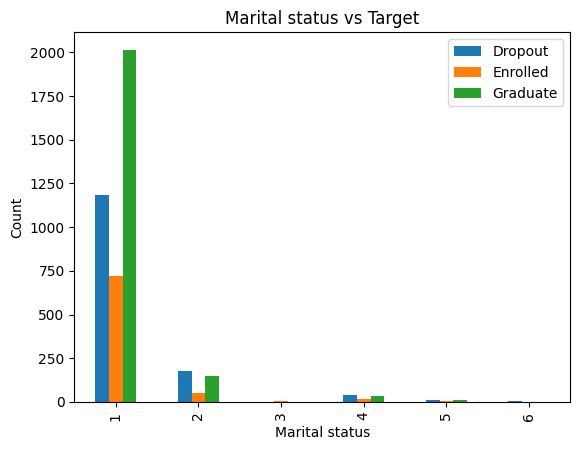

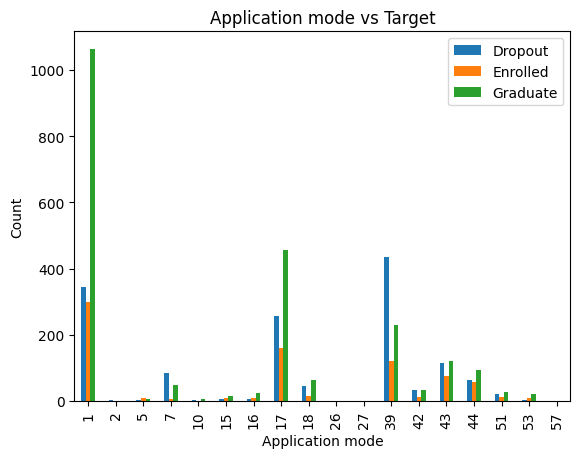

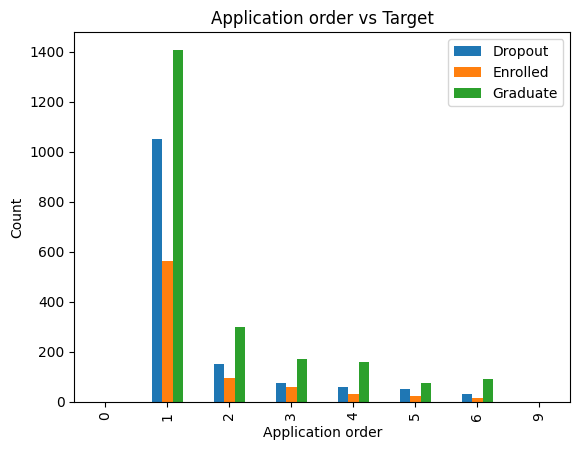

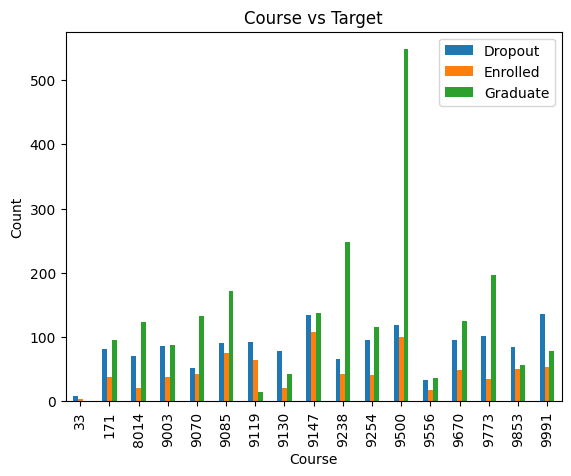

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


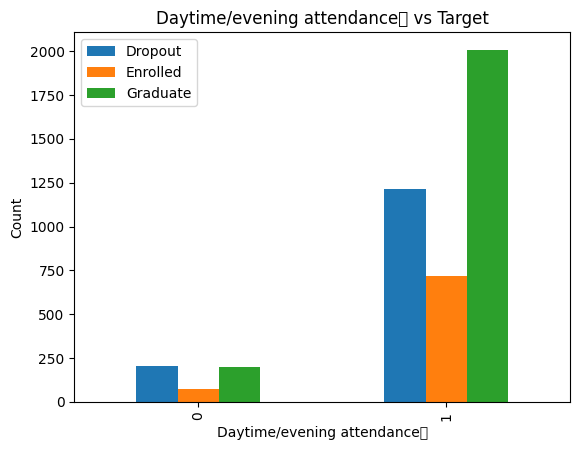

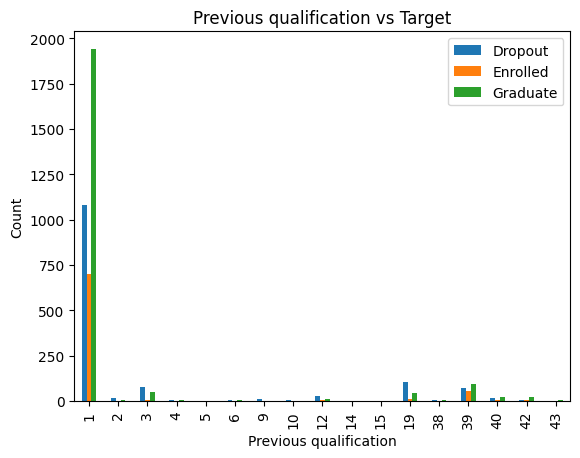

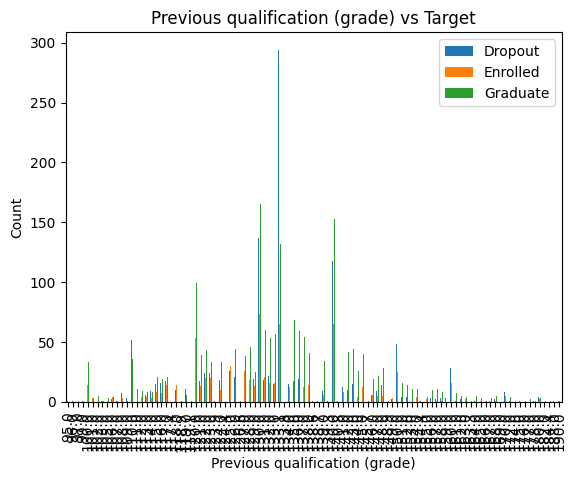

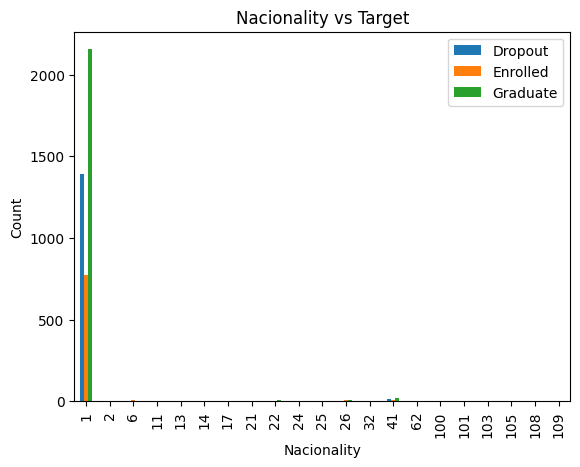

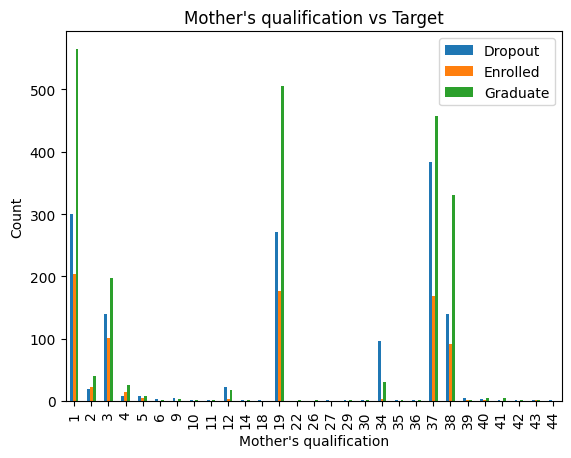

...

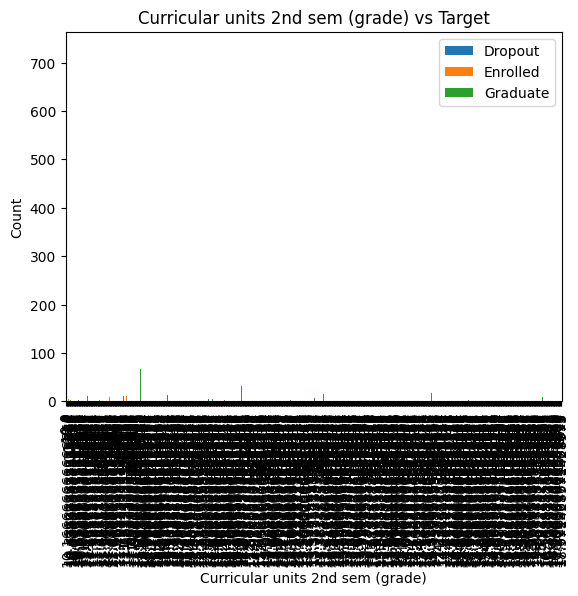

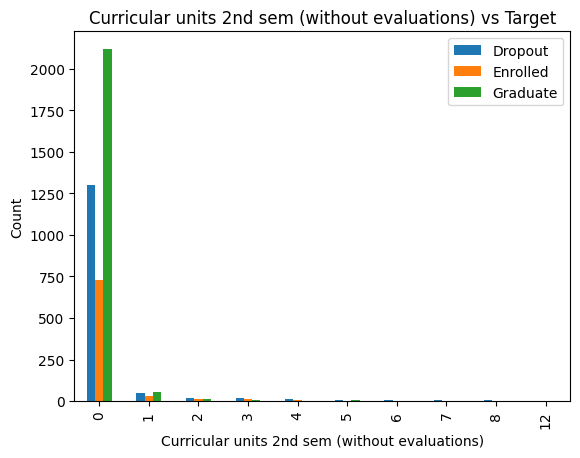

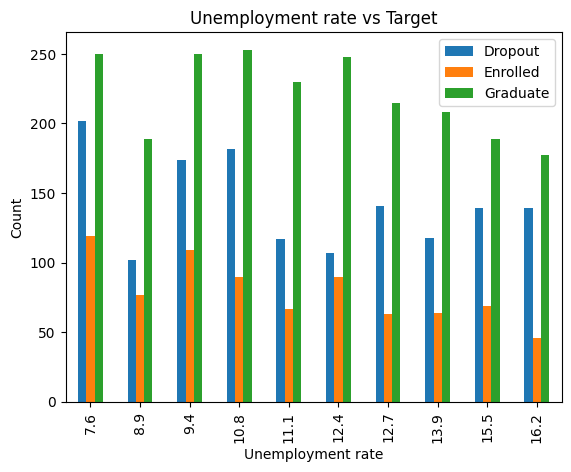

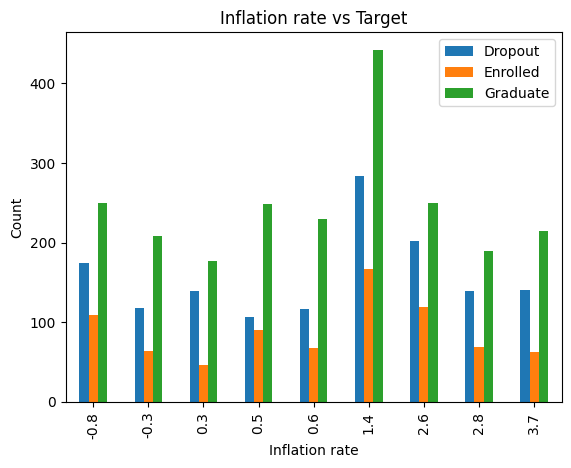

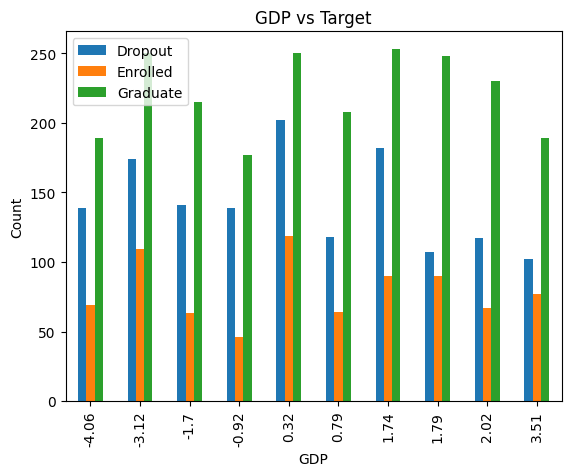

In [ ]:
#bivariate
# List of attributes except 'Target'
attributes_bi = df.columns.tolist()
attributes_bi.remove('Target')

# Plot grouped bar graphs for each attribute against 'Target'
for attribute in attributes_bi:
    grouped_data = df.groupby([attribute,'Target']).size().unstack()
    grouped_data.plot(kind='bar', stacked=False)
    plt.title(f"{attribute} vs Target")
    plt.xlabel(attribute)
    plt.ylabel("Count")
    plt.legend()
    plt.show()

Given the extremely large amount of observations, the individual values for Curricular units 1st and 2nd sem (grade), Previous qualitfication (grade) and Admission grade yielded no clear observations on a grouped bar graph.

###2.2.2.2 Bivariate analysis- Stacked line graphs

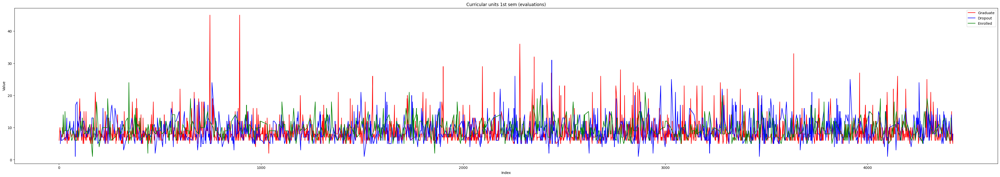

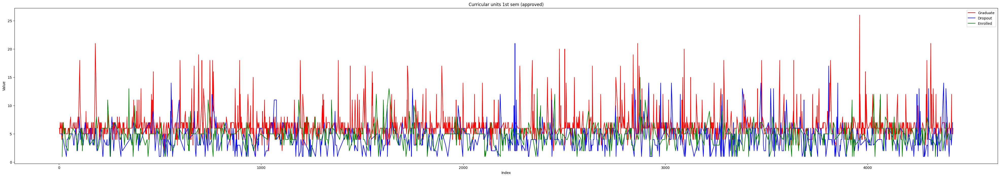

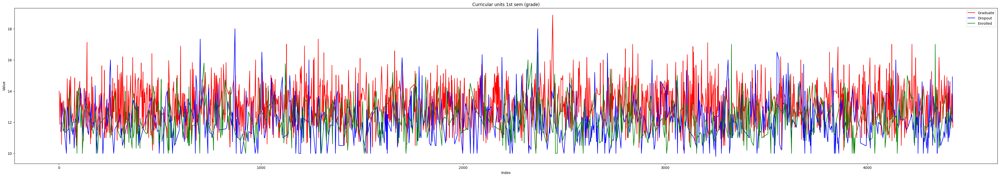

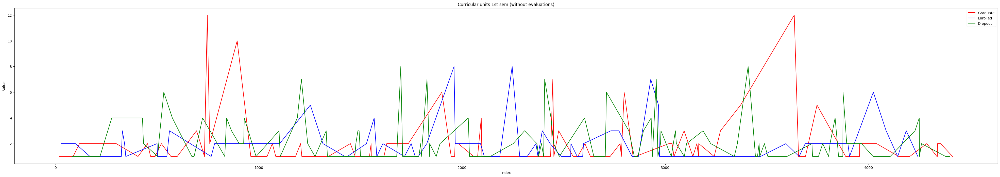

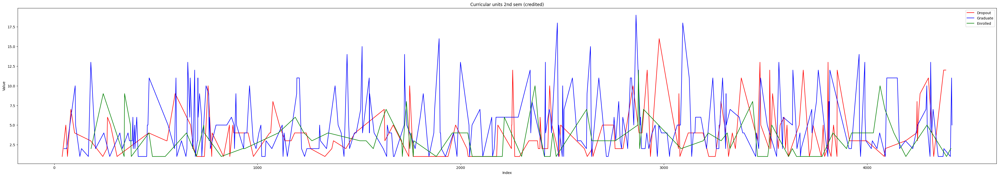

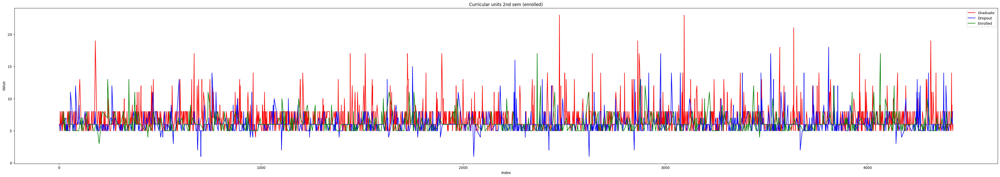

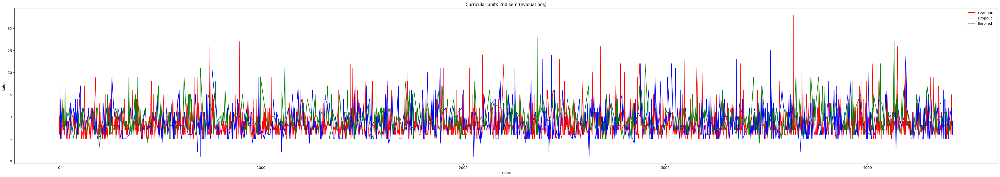

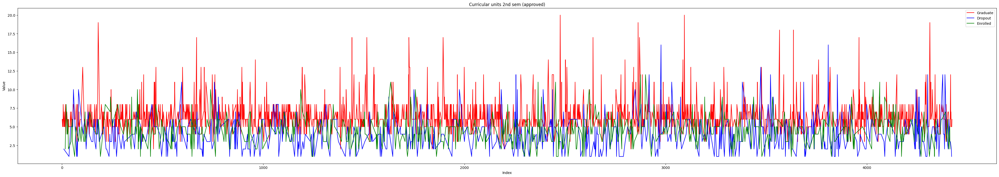

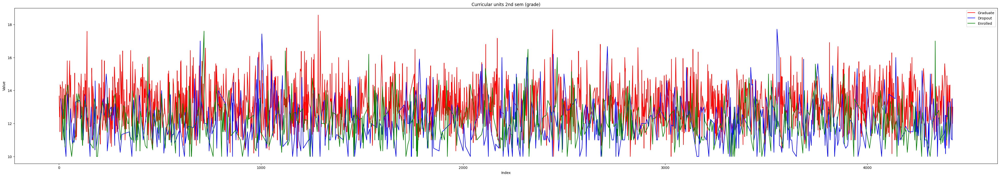

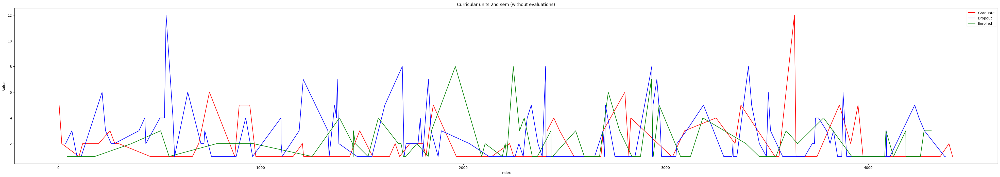

In [ ]:
# List of attributes for line graph
attributes_line = ["Curricular units 1st sem (evaluations)",
               "Curricular units 1st sem (approved)",
               "Curricular units 1st sem (grade)",
               "Curricular units 1st sem (without evaluations)",
               "Curricular units 2nd sem (credited)",
               "Curricular units 2nd sem (enrolled)",
               "Curricular units 2nd sem (evaluations)",
               "Curricular units 2nd sem (approved)",
               "Curricular units 2nd sem (grade)",
               "Curricular units 2nd sem (without evaluations)"]

# Function to plot line graph for each attribute
def plot_stacked_line_graph(attribute):
    # Get the data for the current attribute
    data = df[[attribute, "Target"]]

    # Too many values, remove all observations with 0
    data = data[data[attribute] != 0]

    # List of unique values for target attribute
    unique_values = data["Target"].unique()

    # List of colors for each unique value
    colors = ["red", "blue", "green"]

    fig, ax = plt.subplots(figsize=(50, 8))

    # Iterate over each unique value in target attribute
    for i, value in enumerate(unique_values):
        current_data = data[data["Target"] == value]
        ax.plot(current_data[attribute], label=value, color=colors[i])

    # Set title and legend
    ax.set_title(attribute)
    ax.legend()

    # Set axis labels
    ax.set_xlabel("Index")
    ax.set_ylabel("Value")

    # Plot
    plt.show()

# Iterate over each attribute and plot a stacked line graph
for attribute in attributes_line:
    plot_stacked_line_graph(attribute)


Even after filtering out observations with '0' values, there do not seem to be obvious observations from the graphs.

###2.2.3 Multivariate analysis

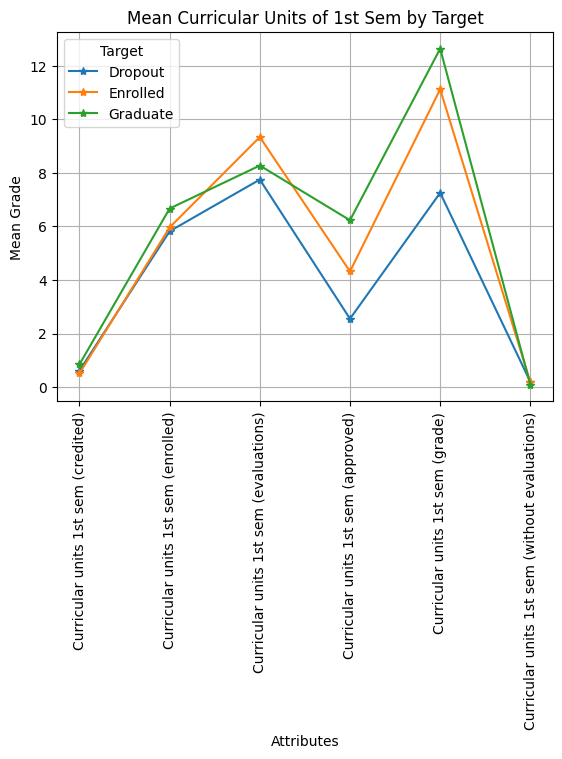

In [ ]:
# 1st sem attributes selected from df
attributes = ['Curricular units 1st sem (credited)', 'Curricular units 1st sem (enrolled)',
              'Curricular units 1st sem (evaluations)', 'Curricular units 1st sem (approved)',
              'Curricular units 1st sem (grade)', 'Curricular units 1st sem (without evaluations)','Target']

df_selected = df[attributes]

# Group data by the 'Target' attribute and calculate mean for attributes
df_grouped = df_selected.groupby('Target').mean()

# Plot line graph
ax = df_grouped.T.plot(kind='line', marker='*')
plt.xlabel('Attributes')
plt.ylabel('Mean Grade')
plt.title('Mean Curricular Units of 1st Sem by Target')
plt.legend(title='Target')
plt.grid(True)

# Rotate x-axis labels by right angle to fit
plt.xticks(rotation=90)

plt.show()


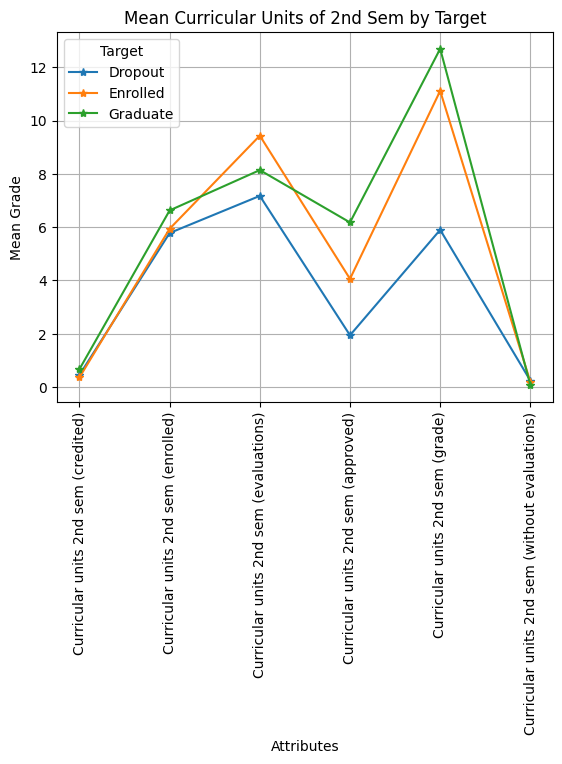

In [ ]:
# 2nd sem attributes list selected from df
attributes = ['Curricular units 2nd sem (credited)', 'Curricular units 2nd sem (enrolled)',
              'Curricular units 2nd sem (evaluations)', 'Curricular units 2nd sem (approved)',
              'Curricular units 2nd sem (grade)', 'Curricular units 2nd sem (without evaluations)','Target']

df_selected = df[attributes]

# Group data by the 'Target' attribute and calculate mean for attributes
df_grouped = df_selected.groupby('Target').mean()

# Plot line graph
ax = df_grouped.T.plot(kind='line', marker='*')
plt.xlabel('Attributes')
plt.ylabel('Mean Grade')
plt.title('Mean Curricular Units of 2nd Sem by Target')
plt.legend(title='Target')
plt.grid(True)

# Rotate x-axis labels by right angle to fit
plt.xticks(rotation=90)

plt.show()

Interestingly, on average, the same pattern is observed between Curricular Units between 1st and 2nd semester. The highest value is expectedly the grades for those who graduated, but for those who dropped out, the highest value is evaluations.

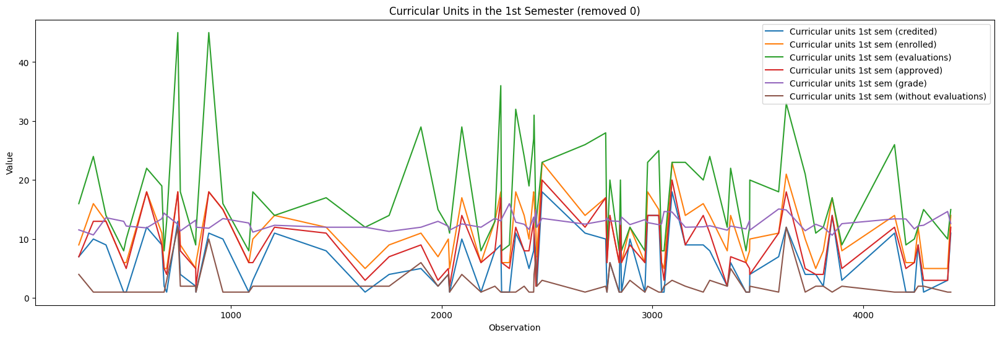

In [ ]:
# Select semester attributes
attributes = ['Curricular units 1st sem (credited)', 'Curricular units 1st sem (enrolled)',
              'Curricular units 1st sem (evaluations)', 'Curricular units 1st sem (approved)',
              'Curricular units 1st sem (grade)', 'Curricular units 1st sem (without evaluations)']
selected_data = df[attributes]

# Remove observations with 0 values
selected_data = selected_data[(selected_data != 0).all(axis=1)]

# Plot attributes as stacked bar graph
selected_data.plot(kind='line', figsize=(20, 6))

# Set the plot title and labels
plt.title('Curricular Units in the 1st Semester (removed 0)')
plt.xlabel('Observation')
plt.ylabel('Value')

# Show the plot
plt.show()

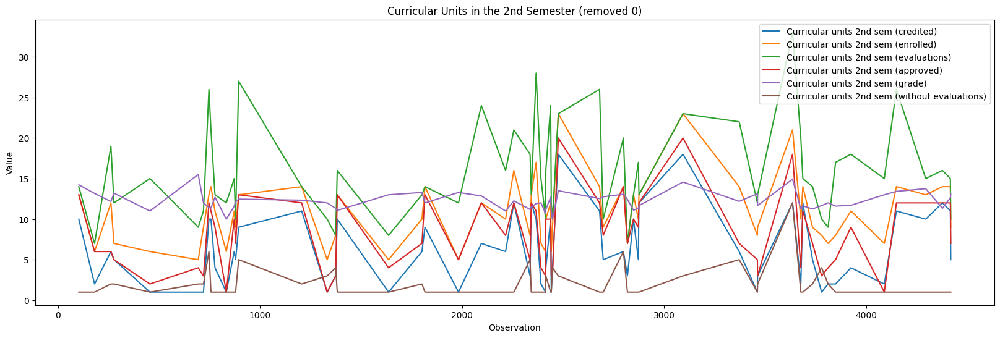

In [ ]:
# 2nd semester attributes
attributes = ['Curricular units 2nd sem (credited)', 'Curricular units 2nd sem (enrolled)',
              'Curricular units 2nd sem (evaluations)', 'Curricular units 2nd sem (approved)',
              'Curricular units 2nd sem (grade)', 'Curricular units 2nd sem (without evaluations)']
selected_data = df[attributes]

# Remove observations with 0 values
selected_data = selected_data[(selected_data != 0).all(axis=1)]

# Plot attributes as stacked bar graph
selected_data.plot(kind='line', figsize=(20, 6))

# Set plot title and labels
plt.title('Curricular Units in the 2nd Semester (removed 0)')
plt.xlabel('Observation')
plt.ylabel('Value')

# Show plot
plt.show()

Due to the large number of observations recorded, null values are removed.

### 2.2.3.2 Collinearity heatmap

<ipython-input-14-5db0a770d159>:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df.corr()
/usr/local/lib/python3.10/dist-packages/seaborn/utils.py:80: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.draw()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


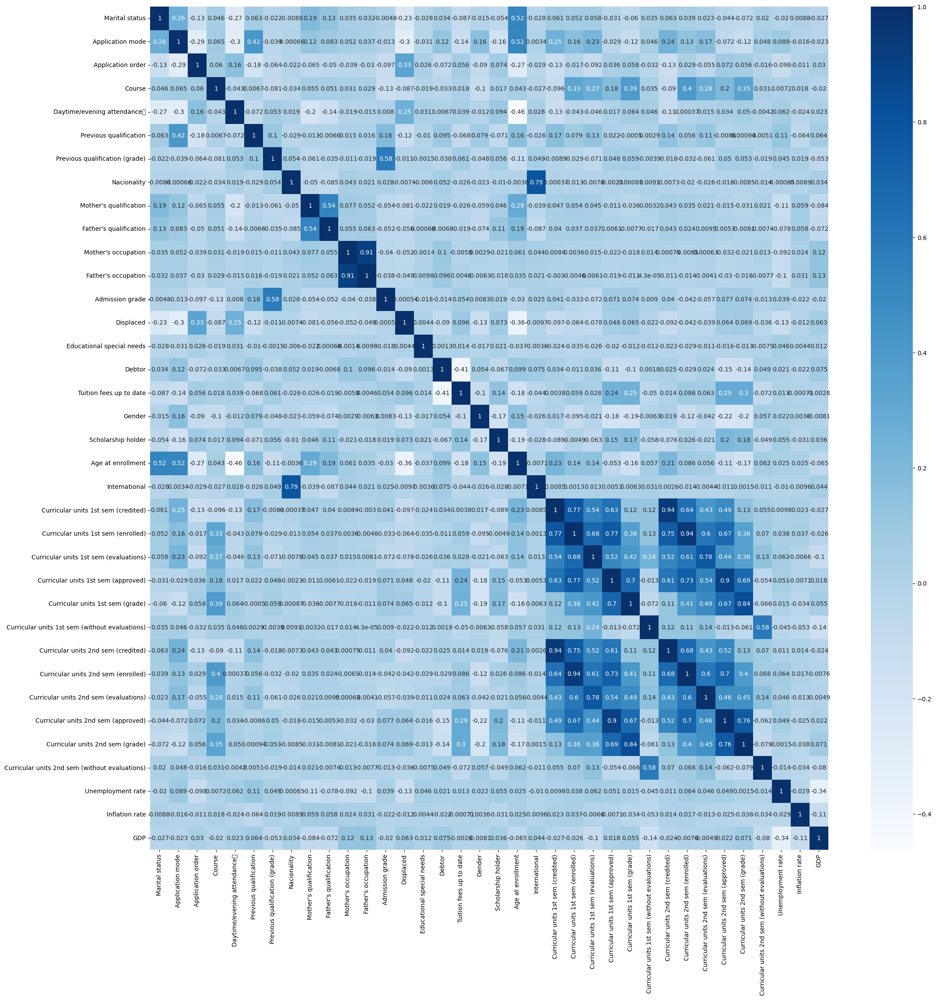

In [ ]:
#collinearity check
import seaborn as sns

#correlation matrix
corr = df.corr()

#plot as heatmap
plt.figure(figsize=(25, 25))
sns.heatmap(corr, annot=True, cmap="Blues")
plt.show()

The closer that values are to 1 or -1, the more highly correlated they are. From the heatmap, it can be seen that a cluster of highly correlated attributes for Curricular units from 1st and 2nd semester in particular. Assuming a threshold for dimensionality reduction to be an absolute value of 0.7, the following pairs of attributes that exceed that are:

*   Father's occupation & mother's occupation - 0.91
*   Nationality & International - 0.79
*   All curricular units both 1st and 2nd sem have varying levels of correlation with each other ranging from 0.7 to 0.95.

As such, it is recommended that only one attribute from each pair is retained for Father's occupation & mother's occupation and Nationality & International. For curricular units, it is recommended that an average be derived from these values considering their high values of collinearity.



# 3.   Data preparation

Resolve aforementioned data quality issues
*  Outliers
*  Duplicate data
*  Inconsistent data
*  Missing data

Removal of unnecessary attributes
*  consider removing macroeconmic attributes (lack of relevancy)

Remove target attribute of 'enrolled'
*   student status of 'enrolled' is not meaningful in prediction of academic success



##3.1 Outliers

In [ ]:
# Brief overview of type of data in each column
df.describe()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,Mother's occupation,Father's occupation,Admission grade,Displaced,Educational special needs,Debtor,Tuition fees up to date,Gender,Scholarship holder,Age at enrollment,International,Curricular units 1st sem (credited),Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP
count,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000
mean,1.178571,18.669078,1.727848,8856.642631,0.890823,4.577758,132.613314,1.873192,19.561935,22.275316,10.960895,11.032324,126.978119,0.548373,0.011528,0.113698,0.880651,0.351718,0.248418,23.265145,0.024864,0.709991,6.270570,8.299051,4.706600,10.640822,0.137658,0.541817,6.232143,8.063291,4.435805,10.230206,0.150316,11.566139,1.228029,0.001969
std,0.605747,17.484682,1.313793,2063.566416,0.311897,10.216592,13.188332,6.914514,15.603186,15.343108,26.418253,25.263040,14.482001,0.497711,0.106760,0.317480,0.324235,0.477560,0.432144,7.587816,0.155729,2.360507,2.480178,4.179106,3.094238,4.843663,0.690880,1.918546,2.195951,3.947951,3.014764,5.210808,0.753774,2.663850,1.382711,2.269935
min,1.000000,1.000000,0.000000,33.000000,0.000000,1.000000,95.000000,1.000000,1.000000,1.000000,0.000000,0.000000,95.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.600000,-0.800000,-4.060000
25%,1.000000,1.000000,1.000000,9085.000000,1.000000,1.000000,125.000000,1.000000,2.000000,3.000000,4.000000,4.000000,117.900000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,19.000000,0.000000,0.000000,5.000000,6.000000,3.000000,11.000000,0.000000,0.000000,5.000000,6.000000,2.000000,10.750000,0.000000,9.400000,0.300000,-1.700000
50%,1.000000,17.000000,1.000000,9238.000000,1.000000,1.000000,133.100000,1.000000,19.000000,19.000000,5.000000,7.000000,126.100000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,20.000000,0.000000,0.000000,6.000000,8.000000,5.000000,12.285714,0.000000,0.000000,6.000000,8.000000,5.000000,12.200000,0.000000,11.100000,1.400000,0.320000
75%,1.000000,39.000000,2.000000,9556.000000,1.000000,1.000000,140.000000,1.000000,37.000000,37.000000,9.000000,9.000000,134.800000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,25.000000,0.000000,0.000000,7.000000,10.000000,6.000000,13.400000,0.000000,0.000000,7.000000,10.000000,6.000000,13.333333,0.000000,13.900000,2.600000,1.790000
max,6.000000,57.000000,9.000000,9991.000000,1.000000,43.000000,190.000000,109.000000,44.000000,44.000000,194.000000,195.000000,190.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,70.000000,1.000000,20.000000,26.000000,45.000000,26.000000,18.875000,12.000000,19.000000,23.000000,33.000000,20.000000,18.571429,12.000000,16.200000,3.700000,3.510000


It is found that Unemployment rate, Inflation rate, GDP, and Grades for curricular units 1st and 2nd semester all are continuous, which may show signs of outliers.

(array([1, 2, 3, 4, 5]),
 [Text(1, 0, 'Curricular units 1st sem (grade)'),
  Text(2, 0, 'Curricular units 2nd sem (grade)'),
  Text(3, 0, 'Unemployment rate'),
  Text(4, 0, 'Inflation rate'),
  Text(5, 0, 'GDP')])

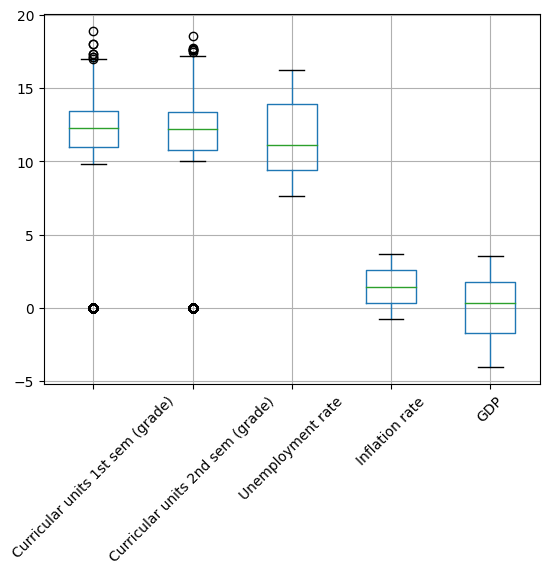

In [ ]:
# Visualization on continuous variables
df.boxplot(column=["Curricular units 1st sem (grade)","Curricular units 2nd sem (grade)","Unemployment rate", "Inflation rate", "GDP"])
plt.xticks(rotation=45)

Based on the boxplot, outliers were found on both grades in the 1st and 2nd semester. Some students were having 0 units in grade, which is likely caused by the fact that they were dropouts or not enrolled for the semester.

Since we are trying to predict success and dropout of students, the outliers on 0 valued grade should not be omitted as we may likely delete the "dropout" observations in our target variable

In [ ]:
# Removing outliers based on cutoff range
outliers = df[(df['Curricular units 1st sem (grade)'] > 17) | (df['Curricular units 2nd sem (grade)'] > 17)].index
df.drop(outliers, inplace=True)
df.describe()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,Mother's occupation,Father's occupation,Admission grade,Displaced,Educational special needs,Debtor,Tuition fees up to date,Gender,Scholarship holder,Age at enrollment,International,Curricular units 1st sem (credited),Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP
count,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000,4411.000000
mean,1.178418,18.642031,1.728860,8855.397189,0.890728,4.577193,132.598141,1.873498,19.578100,22.281569,10.980957,11.048062,126.929585,0.548402,0.011562,0.113806,0.880299,0.350714,0.248923,23.256404,0.024711,0.711857,6.272501,8.298572,4.706189,10.622317,0.137611,0.541374,6.232147,8.062571,4.432555,10.211195,0.150306,11.563047,1.230447,0.001730
std,0.606201,17.485217,1.314296,2066.419717,0.312016,10.217260,13.167516,6.923184,15.605495,15.345472,26.454215,25.297987,14.430912,0.497708,0.106915,0.317612,0.324648,0.477248,0.432438,7.586882,0.155260,2.363688,2.483252,4.183159,3.097041,4.838429,0.691292,1.919302,2.196590,3.951599,3.015030,5.205919,0.754329,2.663798,1.383030,2.270017
min,1.000000,1.000000,0.000000,33.000000,0.000000,1.000000,95.000000,1.000000,1.000000,1.000000,0.000000,0.000000,95.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.600000,-0.800000,-4.060000
25%,1.000000,1.000000,1.000000,9085.000000,1.000000,1.000000,125.000000,1.000000,2.000000,3.000000,4.000000,4.000000,117.850000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,19.000000,0.000000,0.000000,5.000000,6.000000,3.000000,11.000000,0.000000,0.000000,5.000000,6.000000,2.000000,10.750000,0.000000,9.400000,0.300000,-1.700000
50%,1.000000,17.000000,1.000000,9238.000000,1.000000,1.000000,133.100000,1.000000,19.000000,19.000000,5.000000,7.000000,126.100000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,20.000000,0.000000,0.000000,6.000000,8.000000,5.000000,12.285714,0.000000,0.000000,6.000000,8.000000,5.000000,12.200000,0.000000,11.100000,1.400000,0.320000
75%,1.000000,39.000000,2.000000,9556.000000,1.000000,1.000000,140.000000,1.000000,37.000000,37.000000,9.000000,9.000000,134.750000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,25.000000,0.000000,0.000000,7.000000,10.000000,6.000000,13.385357,0.000000,0.000000,7.000000,10.000000,6.000000,13.333333,0.000000,13.900000,2.600000,1.790000
max,6.000000,57.000000,9.000000,9991.000000,1.000000,43.000000,190.000000,109.000000,44.000000,44.000000,194.000000,195.000000,190.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,70.000000,1.000000,20.000000,26.000000,45.000000,26.000000,17.000000,12.000000,19.000000,23.000000,33.000000,20.000000,17.000000,12.000000,16.200000,3.700000,3.510000


13 rows of observation have been removed as they are considered outliers in the 'grades' section

##3.2 Missing & Duplicated Data

In [ ]:
# Show total of missing value in each column
df.isna().sum()

Marital status                                    0
Application mode                                  0
Application order                                 0
Course                                            0
Daytime/evening attendance\t                      0
Previous qualification                            0
Previous qualification (grade)                    0
Nacionality                                       0
Mother's qualification                            0
Father's qualification                            0
Mother's occupation                               0
Father's occupation                               0
Admission grade                                   0
Displaced                                         0
Educational special needs                         0
Debtor                                            0
Tuition fees up to date                           0
Gender                                            0
Scholarship holder                                0
Age at enrol

Since there are no missing values in all columns, there is no need for imputation

In [ ]:
# Check for any duplicated values
df.duplicated().sum()

0

There is no duplicated data in the dataset. Each entry in the dataset is unique which represents the student's personal details


##3.3 Irrelevant Data and Index Rearrangement


Macroeconomic variables like unemployment and inflation rate, as well as GDP is removed as it is considered irrelevant to the contribution towards the dropout chance of students.

The 'Enrolled' value in 'Target' variable is considered to be irrelevant as we are trying to predict whether a student will graduate or eventually dropped out from the program only. This way the target variable becomes a binary variable which makes it easier during the modelling phase.

The index of the dataset has to be rearranged too as it is not in order due to removal of rows during data cleaning phase.

In [ ]:
# Removing macroeconomics attributes
df = df.drop(['Unemployment rate', 'Inflation rate', 'GDP'], axis=1)

In [ ]:
# Removing 'enrolled'
df = df[df.Target != 'Enrolled']

In [ ]:
# Rearranging index
df = df.reset_index(drop=True)

df.head(10)

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,Mother's occupation,Father's occupation,Admission grade,Displaced,Educational special needs,Debtor,Tuition fees up to date,Gender,Scholarship holder,Age at enrollment,International,Curricular units 1st sem (credited),Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations)
count,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.00000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000
mean,1.184356,18.394417,1.751244,8852.767275,0.887231,4.531786,132.900470,1.828082,20.012161,22.584301,10.159757,10.29906,127.234715,0.548922,0.011056,0.113875,0.865672,0.343007,0.267551,23.454947,0.023494,0.756495,6.339690,8.070205,4.791321,10.513374,0.128800,0.581260,6.296296,7.760365,4.514925,10.014371,0.142067
std,0.613649,17.360353,1.334359,2072.047195,0.316355,10.022905,13.212874,6.676768,15.587876,15.277715,23.351089,22.43732,14.549397,0.497670,0.104578,0.317703,0.341052,0.474779,0.442743,7.830157,0.151486,2.481030,2.574385,4.291306,3.241179,5.051912,0.679487,2.023679,2.263800,3.968261,3.162876,5.476875,0.748231
min,1.000000,1.000000,0.000000,33.000000,0.000000,1.000000,95.000000,1.000000,1.000000,1.000000,0.000000,0.00000,95.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,1.000000,9085.000000,1.000000,1.000000,125.000000,1.000000,2.000000,3.000000,4.000000,4.00000,118.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,19.000000,0.000000,0.000000,5.000000,6.000000,3.000000,11.000000,0.000000,0.000000,5.000000,6.000000,2.000000,10.500000,0.000000
50%,1.000000,17.000000,1.000000,9254.000000,1.000000,1.000000,133.100000,1.000000,19.000000,19.000000,5.000000,7.00000,126.500000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,20.000000,0.000000,0.000000,6.000000,8.000000,5.000000,12.333333,0.000000,0.000000,6.000000,8.000000,5.000000,12.326429,0.000000
75%,1.000000,39.000000,2.000000,9556.000000,1.000000,1.000000,140.000000,1.000000,37.000000,37.000000,9.000000,9.00000,135.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,25.000000,0.000000,0.000000,7.000000,10.000000,6.000000,13.500000,0.000000,0.000000,7.000000,10.000000,6.000000,13.500000,0.000000
max,6.000000,57.000000,6.000000,9991.000000,1.000000,43.000000,190.000000,109.000000,44.000000,44.000000,194.000000,195.00000,190.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,70.000000,1.000000,20.000000,26.000000,45.000000,26.000000,17.000000,12.000000,19.000000,23.000000,33.000000,20.000000,16.909091,12.000000


The dataset is left with 3618 observations with 34 variables in total.

##3.4 Collinearity Issues

As mentioned during data exploration, collinearity is present among a few variables, namely occupations, curricular units, as well as nationality. Its best if we resolve this issue before the modelling phase.

Before dropping any highly correlated variables, it is recommended to determine which feature is important towards influencing the target variable first. The VIF (variance inflation factor) is used here as an indicator to which features show signs of multicollinearity.

If the VIF is found to be more than 5, then it is considered high in collinearity and we can remove said variables.

In [ ]:
# Checking multicollinearity with VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

corr_features = df[["Mother's occupation","Father's occupation",'Curricular units 1st sem (credited)', 'Curricular units 1st sem (enrolled)',
              'Curricular units 1st sem (evaluations)', 'Curricular units 1st sem (approved)',
              'Curricular units 1st sem (grade)', 'Curricular units 1st sem (without evaluations)','Curricular units 2nd sem (credited)', 'Curricular units 2nd sem (enrolled)',
              'Curricular units 2nd sem (evaluations)', 'Curricular units 2nd sem (approved)',
              'Curricular units 2nd sem (grade)', 'Curricular units 2nd sem (without evaluations)', "Nacionality", "International"]]

# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = corr_features.columns

# Calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(corr_features.values, i)
                          for i in range(len(corr_features.columns))]

print(vif_data)


                                           feature         VIF
0                              Mother's occupation    5.591642
1                              Father's occupation    5.674361
2              Curricular units 1st sem (credited)   17.981702
3              Curricular units 1st sem (enrolled)  161.492154
4           Curricular units 1st sem (evaluations)   18.675894
5              Curricular units 1st sem (approved)   48.390654
6                 Curricular units 1st sem (grade)   28.241112
7   Curricular units 1st sem (without evaluations)    1.766944
8              Curricular units 2nd sem (credited)   14.110624
9              Curricular units 2nd sem (enrolled)  139.364955
10          Curricular units 2nd sem (evaluations)   16.876389
11             Curricular units 2nd sem (approved)   36.968439
12                Curricular units 2nd sem (grade)   26.243353
13  Curricular units 2nd sem (without evaluations)    1.688817
14                                     Nacionality    2

Most variables related to the curricular units show most sign of multicollinearity, with a few exceptions. It is found that curricular units that have not been evaluated are not highly correlated, which indicates that they are suited to be included for modelling. However, a curricular unit which has not been evaluated seems to not makes sense in our prediction of dropout rates since the official grades of students more often than not, reflects their status in the program. Hence, it is logical to include the final grades in each semester as well, despite their high collinearity.

As for occupation, there seems to be collinearity present as the value is slightly above 5. While the nationality features show no sign of collinearity with international status. Hence, both parent's occupation should be removed as well while both nationality and international status may be retained.

In [ ]:
# Dropping highly correlated features
df = df.drop(["Mother's occupation","Father's occupation",'Curricular units 1st sem (credited)', 'Curricular units 1st sem (enrolled)',
              'Curricular units 1st sem (evaluations)', 'Curricular units 1st sem (approved)',
              'Curricular units 2nd sem (credited)', 'Curricular units 2nd sem (enrolled)',
              'Curricular units 2nd sem (evaluations)', 'Curricular units 2nd sem (approved)'], axis=1)

df.describe()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,Admission grade,Displaced,Educational special needs,Debtor,Tuition fees up to date,Gender,Scholarship holder,Age at enrollment,International,Curricular units 1st sem (grade),Curricular units 1st sem (without evaluations),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations)
count,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000,3618.000000
mean,1.184356,18.394417,1.751244,8852.767275,0.887231,4.531786,132.900470,1.828082,20.012161,22.584301,127.234715,0.548922,0.011056,0.113875,0.865672,0.343007,0.267551,23.454947,0.023494,10.513374,0.128800,10.014371,0.142067
std,0.613649,17.360353,1.334359,2072.047195,0.316355,10.022905,13.212874,6.676768,15.587876,15.277715,14.549397,0.497670,0.104578,0.317703,0.341052,0.474779,0.442743,7.830157,0.151486,5.051912,0.679487,5.476875,0.748231
min,1.000000,1.000000,0.000000,33.000000,0.000000,1.000000,95.000000,1.000000,1.000000,1.000000,95.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,1.000000,9085.000000,1.000000,1.000000,125.000000,1.000000,2.000000,3.000000,118.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,19.000000,0.000000,11.000000,0.000000,10.500000,0.000000
50%,1.000000,17.000000,1.000000,9254.000000,1.000000,1.000000,133.100000,1.000000,19.000000,19.000000,126.500000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,20.000000,0.000000,12.333333,0.000000,12.326429,0.000000
75%,1.000000,39.000000,2.000000,9556.000000,1.000000,1.000000,140.000000,1.000000,37.000000,37.000000,135.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,25.000000,0.000000,13.500000,0.000000,13.500000,0.000000
max,6.000000,57.000000,6.000000,9991.000000,1.000000,43.000000,190.000000,109.000000,44.000000,44.000000,190.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,70.000000,1.000000,17.000000,12.000000,16.909091,12.000000


##3.5 Combining Variables

As mentioned previously, the curricular units have signs of multicollinearity. However, the 'grades' unit was not removed as it is relevant to our target variable, and unevaluated units was included in the dataset due to low collinearity.

Based on the values alone, the variables do not carry much meaning towards our analysis. Hence, it is recommended that an average (or single value) be derived from these values considering their high values of collinearity as well as to allow easy interpretability.

With that in mind, back in our outliers exploration, it was inferred that students with 0 curricular units as their final grade could indicate that they have dropped out from the program before the start of the academic year. The units before evaluation does not give much meaning as well since the units are not officially evaluated by the institute, hence it is logical to not include that in our analysis.

Hence, the final decision of including 'grade' in our dataset seems feasible. To avoid collinearity issues caused by both semesters' grades. The grades from both semesters are combined to give the average grade achieved by each students in an academic year (assume 1 year = 2 semesters)

In [ ]:
# Drop unevaluated units
df = df.drop(["Curricular units 1st sem (without evaluations)", "Curricular units 2nd sem (without evaluations)"], axis=1)

In [ ]:
# Combine both grades to give average grade per academic year
df['Avg grade in an academic year'] = df[['Curricular units 1st sem (grade)', 'Curricular units 2nd sem (grade)']].mean(axis=1)

df = df.drop(["Curricular units 1st sem (grade)", "Curricular units 2nd sem (grade)"], axis=1)

In [ ]:
# Final overview of dataset
df

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,Admission grade,Displaced,Educational special needs,Debtor,Tuition fees up to date,Gender,Scholarship holder,Age at enrollment,International,Target,Avg grade in an academic year
0,1,17,5,171,1,1,122.0,1,19,12,127.3,1,0,0,1,1,0,20,0,Dropout,0.000000
1,1,15,1,9254,1,1,160.0,1,1,3,142.5,1,0,0,0,1,0,19,0,Graduate,13.833333
2,1,1,5,9070,1,1,122.0,1,37,37,124.8,1,0,0,0,1,0,19,0,Dropout,0.000000
3,1,17,2,9773,1,1,122.0,1,38,37,119.6,1,0,0,1,0,0,20,0,Graduate,12.914286
4,2,39,1,8014,0,1,100.0,1,37,38,141.5,0,0,0,1,0,0,45,0,Graduate,12.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3613,1,1,6,9773,1,1,125.0,1,1,1,122.2,0,0,0,1,1,0,19,0,Graduate,13.133333
3614,1,1,2,9773,1,1,120.0,105,1,1,119.0,1,0,1,0,0,0,18,1,Dropout,11.500000
3615,1,1,1,9500,1,1,154.0,1,37,37,149.5,1,0,0,1,0,1,30,0,Dropout,14.206250
3616,1,1,1,9147,1,1,180.0,1,37,37,153.8,1,0,0,1,0,1,20,0,Graduate,12.900000


With that, the dataset is cleaned and is ready for further analysis and modelling. The final dataset ends up with 3618 observations along with 20 predictors.

# 4.   Modeling
Proposed models for classification:

*   decision tree/ random forest
*   logistic regression
*   k-nearest neighbour
*   SVM
*   naives bayes

In [ ]:
#Import package needed for modelling
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Load the dataset
data = df

# Separate predictors and target variable
X = data.drop('Target', axis=1)
y = data['Target']

# Split the dataset into training and testing sets (Imbalanced dataset)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42,stratify = y)

**4.1 Undersampling Method**
<br>
Undersampling method is used to balance the dataset. As noticed in the dataset, the number of graduated students are more than number of dropped out student. Hence, undersampling method is conducted towards the dataset and reduced the number of graduated students data to equal to the number of dropped out student by randomly selecting from the graduated student data.

In [ ]:
"""
from imblearn.under_sampling import RandomUnderSampler
import pandas as pd

# Initialize the RandomUnderSampler
undersampler = RandomUnderSampler(random_state=42)

# Resample the dataset
X_resampled, y_resampled = undersampler.fit_resample(X, y)

# Create a new balanced DataFrame
balanced_df = pd.concat([X_resampled, y_resampled], axis=1)

# Check the new class distribution
print(balanced_df['Target'].value_counts())

# Separate predictors and target variable
X = balanced_df.drop('Target', axis=1)
y = balanced_df['Target']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
"""

"\nfrom imblearn.under_sampling import RandomUnderSampler\nimport pandas as pd\n\n# Initialize the RandomUnderSampler\nundersampler = RandomUnderSampler(random_state=42)\n\n# Resample the dataset\nX_resampled, y_resampled = undersampler.fit_resample(X, y)\n\n# Create a new balanced DataFrame\nbalanced_df = pd.concat([X_resampled, y_resampled], axis=1)\n\n# Check the new class distribution\nprint(balanced_df['Target'].value_counts())\n\n# Separate predictors and target variable\nX = balanced_df.drop('Target', axis=1)\ny = balanced_df['Target']\n\n# Split the dataset into training and testing sets\nX_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)\n"

**4.2 Baseline Model**
<br>The baseline model refers to the initial model that serves as a starting point or reference for comparison when developing more advanced models. It provides a benchmark against which the performance of subsequent models can be evaluated.
<br>
What a baseline model can do?

1. Establish a baseline performance level that can be used as a point of comparison

2. Assess its performance on unseen data or evaluate its predictive accuracy using appropriate metrics

3. Introduce more sophisticated techniques such as feature selection, hyperparameter tuning, or using different algorithms to improve upon the baseline model's performance.

<br>In summary, the baseline model is the initial model trained using all predictors, providing a reference point to evaluate the effectiveness of subsequent model iterations or enhancements.

In [ ]:
from sklearn.linear_model import LogisticRegression
# Train the baseline logistic regression model on the training set
baseline_model = LogisticRegression(solver='lbfgs', max_iter=1250)
baseline_model.fit(X_train, y_train)

# Get feature importance (absolute coefficients)
feature_importance = pd.DataFrame({'Predictor': X.columns, 'Importance': abs(baseline_model.coef_[0])})

# Rank predictors by importance
ranked_predictors = feature_importance.sort_values(by='Importance', ascending=False)
print(ranked_predictors)

# Select top predictors (e.g., top 15 predictors)
top_predictors = ranked_predictors.head(15)['Predictor'].tolist()

# Select the top 15 features to be trained
selected_X_train = X_train[top_predictors]

# Select the top 15 features to be tested
selected_X_test = X_test[top_predictors]

                         Predictor  Importance
14         Tuition fees up to date    1.943575
13                          Debtor    1.353819
16              Scholarship holder    1.346252
15                          Gender    0.851868
19   Avg grade in an academic year    0.619607
4     Daytime/evening attendance\t    0.426882
0                   Marital status    0.411206
11                       Displaced    0.240851
18                   International    0.067551
2                Application order    0.057608
17               Age at enrollment    0.050834
12       Educational special needs    0.035769
1                 Application mode    0.014155
6   Previous qualification (grade)    0.011220
10                 Admission grade    0.010233
8           Mother's qualification    0.008265
9           Father's qualification    0.006781
7                      Nacionality    0.004849
5           Previous qualification    0.001771
3                           Course    0.000694


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


**4.3 Logistic Regression**
<br>
Logistic Regression is primarily used for binary classification problems. It models the relationship between a dependent binary variable and one or more independent variables by estimating the probabilities using a logistic function. Logistic Regression is often used when the target variable is categorical and the goal is to predict the probability of a certain class.

In [ ]:
#log reg
from sklearn.linear_model import LogisticRegression

# Build the model with selected predictors using the training set
LR_model = LogisticRegression(solver='lbfgs', max_iter=1250)
LR_model.fit(selected_X_train, y_train)

# Evaluate model performance on the testing set

LRpredictions = LR_model.predict(selected_X_test)
LRaccuracy = accuracy_score(y_test,LRpredictions)
print("Logistic Regression accuracy:", LRaccuracy)

Logistic Regression accuracy: 0.8314917127071824


**4.4 Decision Tree**
<br>
 Decision Trees are a popular choice for both classification and regression problems. They partition the feature space into a tree-like structure based on the values of input features, which enables them to make decisions or predictions by following the learned tree structure. Decision Trees are interpretable and can handle both categorical and numerical features.

In [ ]:
#dt
from sklearn.tree import DecisionTreeClassifier

# Initialize and train the Decision Tree model
decision_tree = DecisionTreeClassifier()
decision_tree.fit(selected_X_train, y_train)

# Make predictions on the testing set
decision_tree_predictions = decision_tree.predict(selected_X_test)

# Calculate accuracy of Decision Tree model
decision_tree_accuracy = accuracy_score(y_test, decision_tree_predictions)
print("Decision Tree Accuracy:", decision_tree_accuracy)

Decision Tree Accuracy: 0.7914364640883977


**4.5 Random Forest**
<br>
Random Forests are an ensemble method that combines multiple Decision Trees to make predictions. They create a collection of Decision Trees, where each tree is trained on a random subset of the training data and features. Random Forests improve upon the decision tree's tendency to overfit and provide more robust predictions by averaging the results from multiple trees.

In [ ]:
#rf
from sklearn.ensemble import RandomForestClassifier

# Initialize and train the Random Forest model
random_forest = RandomForestClassifier()
random_forest.fit(selected_X_train, y_train)

# Make predictions on the testing set
random_forest_predictions = random_forest.predict(selected_X_test)

# Calculate accuracy of Random Forest model
random_forest_accuracy = accuracy_score(y_test, random_forest_predictions)
print("Random Forest Accuracy:", random_forest_accuracy)

Random Forest Accuracy: 0.8687845303867403


**4.6 K-Nearest Neighbour**
<br>
KNN is a simple but effective algorithm used for both regression and classification tasks. It works based on the principle that data points with similar features tend to have similar labels. KNN assigns a class or predicts a value based on the majority vote or average of the k nearest neighbors in the feature space. In the process of selecting the optimal K-value for our KNN model, we evaluated a range of K-values to determine their impact on the model's performance. Through thorough analysis, we discovered that a K-value of 6 yielded the highest accuracy on our validation set.

In [ ]:
#knn
from sklearn.neighbors import KNeighborsClassifier

# Initialize and train the KNN model
knn = KNeighborsClassifier(n_neighbors=6)
knn.fit(selected_X_train, y_train)

# Make predictions on the testing set
knn_predictions = knn.predict(selected_X_test)

# Calculate accuracy of KNN model
knn_accuracy = accuracy_score(y_test, knn_predictions)
print("KNN Accuracy:", knn_accuracy)

KNN Accuracy: 0.7651933701657458


**4.7 Support Vector Machines**
<br>
SVM is a versatile algorithm used for both classification and regression tasks. It creates a hyperplane or a set of hyperplanes in a high-dimensional space that separates the data into different classes. SVMs are particularly effective when dealing with complex decision boundaries and can handle both linear and non-linear problems. The choice of C=100.0 in this code suggests a reasonable balance between margin maximization and misclassification minimization for the given dataset.

In [ ]:
#svm
from sklearn.svm import SVC

# Initialize and train the SVM model
svm = SVC(C=100.0,probability=True)
svm.fit(selected_X_train, y_train)

# Make predictions on the testing set
svm_predictions = svm.predict(selected_X_test)

# Calculate accuracy of SVM model
svm_accuracy = accuracy_score(y_test, svm_predictions)
print("SVM Accuracy:", svm_accuracy)

SVM Accuracy: 0.8370165745856354


**4.8 Naives Bayes**
<br>
Naive Bayes is primarily used for classification tasks, where the goal is to predict the class or category of a given data point based on its features. It is particularly popular in text classification applications.

In [ ]:
#naive bayes
from sklearn.naive_bayes import GaussianNB

# Initialize and train the Naive Bayes model
naive_bayes = GaussianNB()
naive_bayes.fit(selected_X_train, y_train)

# Make predictions on the testing set
naive_bayes_predictions = naive_bayes.predict(selected_X_test)

# Calculate accuracy of Naive Bayes model
naive_bayes_accuracy = accuracy_score(y_test, naive_bayes_predictions)
print("Naive Bayes Accuracy:", naive_bayes_accuracy)

Naive Bayes Accuracy: 0.7928176795580111


**4.9 Prediction Made on Each Model**

In [ ]:
# Create a new DataFrame with the data to be predicted
new_data = pd.DataFrame([[1, 10, 1, 9773, 1, 1, 152, 22, 38, 37, 152, 1, 0, 0, 1, 0, 0, 22, 1, 12.33333333]],
                        columns=['Marital status', 'Application mode', 'Application order', 'Course',
                                 'Daytime/evening attendance\t', 'Previous qualification',
                                 'Previous qualification (grade)', 'Nacionality',
                                 "Mother's qualification", "Father's qualification", 'Admission grade',
                                 'Displaced', 'Educational special needs', 'Debtor',
                                 'Tuition fees up to date', 'Gender', 'Scholarship holder',
                                 'Age at enrollment', 'International', 'Avg grade in an academic year'])

# Select the relevant predictors used during training
selected_new_data = new_data[top_predictors]  # Use the same 'top_predictors' selected during feature selection

# Make predictions using the trained Logistic Regression model
predictions = LR_model.predict(selected_new_data)
print("Predictions (LR):", predictions)

# Make predictions using the trained Decision Tree model
predictions = decision_tree.predict(selected_new_data)
print("Predictions (DT):", predictions)

# Make predictions using the trained Random Forest model
predictions = random_forest.predict(selected_new_data)
print("Predictions (RF):", predictions)

# Make predictions using the trained KNN model
predictions = knn.predict(selected_new_data)
print("Predictions (KNN):", predictions)

# Make predictions using the trained SVM model
predictions = svm.predict(selected_new_data)
print("Predictions (SVM):", predictions)

# Make predictions using the trained Naive Bayes model
predictions = naive_bayes.predict(selected_new_data)
print("Predictions (NB):", predictions)

Predictions (LR): ['Graduate']
Predictions (DT): ['Graduate']
Predictions (RF): ['Graduate']
Predictions (KNN): ['Graduate']
Predictions (SVM): ['Graduate']
Predictions (NB): ['Graduate']


The dataset are used to train a baseline model to identify the feature importance. After the baseline model is trained, we select the top 15 important features to be used as the predictor in training the model. The top 15 features selected are ['Avg grade in an academic year', 'Age at enrollment', 'Tuition fees up to date', 'Scholarship holder', 'Gender', "Mother's qualification", 'Debtor', 'Previous qualification', 'Admission grade', 'Nacionality]. These predictors will be used and update our X_train to selected_X_train and also X_test to selected_X_test. Based on the results obtained, Random Forest has the highest accuracy among all the model trained. All the model were trained on the balanced dataset after undersampling is conducted, however, there is a drastic drop in the accuracy for SVM and KNN model. From all the model trained using balanced dataset, the Random Forest still has the highest accuracy.

# 5.   Evaluation
Discussion of results

Model Evaluation Method
*  Model will be evaluated based on accuracy, precision, recall and F1-score.
*  The confusion matrix can be used to analyze the types of errors the model makes (i.e. false positives, false negatives, true positives, and true negatives).
*  ROC-AUC curve and PR-AUC curve can be used to visualize the tradeoff between true positive rate and false positive rate.



**5.1 Accuracy, Precision, Recall and F1-score**

Accuracy is the most intuitive performance measure for classification models. It is the proportion of observations predicted correctly. Its often used for showing whether a model is being trained correctly and how it performs generally. True positives and true negatives are the observations that are correctly predicted. However in the presence of imbalanced classes, for example in this case, where more students are graduated than dropped out, accuracy might suffer from a paradox where a model is highly accurate but lacks predictive power.

Hence, with the assistance of precision, recall and F1-score, a more comprehensive evaluation is given to quantify the performance of the model. Precision is the proportion of every observation predicted to be positive (true positive and false positive) that is actually positive. In this study, the “positive” is referred to as “graduate”.

Recall, also knowns as sensitivity or true positive rate, is the proportion of every positive observation that is predicted (true positive and false negative) to be positive.

F1-score measures a model’s accuracy by combining and balancing both precision and recall. A good F1-score means that the model has a low false positive rate and a low false negative rate. F1-score 1 means the model is considered perfect while 0 means the model is a total failure.

Classification_report function is used as it is a one-stop function that is able to evaluate a model by showing all four evaluation metrics: accuracy, precision, recall and F1-score.


In [ ]:
# Obtain accuracy, precision, recall and F1-score for each model via classification report
from sklearn.metrics import classification_report

model_list = [LR_model,decision_tree,random_forest,knn,svm,naive_bayes]
model_pred = [LRpredictions,decision_tree_predictions,random_forest_predictions,knn_predictions,svm_predictions,naive_bayes_predictions]
model_name = ["Logistic Regression (LR)",
              "Decision Tree (DT)",
              "Random Forest (RF)",
              "k-Nearest Neighbour (kNN)",
              "Support Vector Machine (SVM)",
              "Naive Bayes (NB)"]
i = 0
for model in model_list:
  print(model_name[i])
  print(classification_report(y_test, model_pred[i]))
  print("\n")
  i += 1

Logistic Regression (LR)
              precision    recall  f1-score   support

     Dropout       0.84      0.70      0.76       283
    Graduate       0.83      0.92      0.87       441

    accuracy                           0.83       724
   macro avg       0.83      0.81      0.82       724
weighted avg       0.83      0.83      0.83       724



Decision Tree (DT)
              precision    recall  f1-score   support

     Dropout       0.72      0.77      0.74       283
    Graduate       0.85      0.80      0.82       441

    accuracy                           0.79       724
   macro avg       0.78      0.79      0.78       724
weighted avg       0.80      0.79      0.79       724



Random Forest (RF)
              precision    recall  f1-score   support

     Dropout       0.87      0.78      0.82       283
    Graduate       0.87      0.92      0.90       441

    accuracy                           0.87       724
   macro avg       0.87      0.85      0.86       724
weighte

Based on the classification reports for each model, the range of accuracy is 77% (kNN) to 87% (RF), the range of precision is 81% (kNN and SVM) to 87% (RF), the range of recall is 81% (kNN) to 95% (SVM) and the range of F1-score is 81% (kNN) to 89% (RF). It can be said that all six models are considered good as most of the evaluation metrics are above 80%. However, k-Nearest Neighbour (kNN) is the worst model among all six models as it as the lowest scores for all four metrics. Support Vector Machine (SVM) has the lowest precision but the highest recall. Random forest is the best model at the moment as it ranked first in three of the metrics: accuracy, precision and F1-score.

Noted that the classification report does not provide specificity directly. Hence it remains unclear how well the model worked in predicting negative (dropout in this study) cases.


**5.2 Confusion Matrix and Specificity**

A confusion matrix is a square matrix that tabulates the counts of true positive, true negative, false positive and false negative predictions of a classifier. Since this study is modelling a binary classification, the size of the matrix is 2x2.

The structure of the confusion matrix is as follows:


In [ ]:
cm = pd.DataFrame({'': ['Actual Positive','Actual Negative'],
                   'Predicted Positive': ['True Positive','False Positive'],
                   'Predicted Negative': ['False Negative','True Negative']})
print(cm)

                   Predicted Positive Predicted Negative
0  Actual Positive      True Positive     False Negative
1  Actual Negative     False Positive      True Negative


Specificity, or known as true negative rate, is the proportion of every negative observation that is predicted (true negative and false positive) to be negative. Hence, a model that correctly predicts all negative observations is very specific while a model that correctly predicts all positive observations is very sensitive.

In [ ]:
# Obtain confusion matrix for each model
from sklearn.metrics import confusion_matrix
from sklearn.metrics import recall_score

model_list = [LR_model,decision_tree,random_forest,knn,svm,naive_bayes]
model_pred = [LRpredictions,decision_tree_predictions,random_forest_predictions,knn_predictions,svm_predictions,naive_bayes_predictions]
model_name = ["Logistic Regression (LR)",
              "Decision Tree (DT)",
              "Random Forest (RF)",
              "k-Nearest Neighbour (kNN)",
              "Support Vector Machine (SVM)",
              "Naive Bayes (NB)"]
i = 0
for model in model_list:
  print(model_name[i])
  # Construct confusion matrix
  print(confusion_matrix(y_test, model_pred[i], labels = ["Graduate","Dropout"]))
  # Obtain recall/sensitivity/true positive rate
  rec = recall_score(y_test, model_pred[i], pos_label= "Graduate")
  print('Sensitivity/True Positive (Graduate) Rate : ',  rec)
  # Obtain specitivity/true negative rate
  spec = recall_score(y_test, model_pred[i], pos_label= "Dropout")
  print('Specitivity/True Negative (Dropout) Rate  : ',  spec)
  print("\n")
  i += 1

Logistic Regression (LR)
[[404  37]
 [ 85 198]]
Sensitivity/True Positive (Graduate) Rate :  0.9160997732426304
Specitivity/True Negative (Dropout) Rate  :  0.6996466431095406


Decision Tree (DT)
[[355  86]
 [ 65 218]]
Sensitivity/True Positive (Graduate) Rate :  0.8049886621315193
Specitivity/True Negative (Dropout) Rate  :  0.7703180212014135


Random Forest (RF)
[[407  34]
 [ 61 222]]
Sensitivity/True Positive (Graduate) Rate :  0.9229024943310657
Specitivity/True Negative (Dropout) Rate  :  0.784452296819788


k-Nearest Neighbour (kNN)
[[356  85]
 [ 85 198]]
Sensitivity/True Positive (Graduate) Rate :  0.8072562358276644
Specitivity/True Negative (Dropout) Rate  :  0.6996466431095406


Support Vector Machine (SVM)
[[418  23]
 [ 95 188]]
Sensitivity/True Positive (Graduate) Rate :  0.9478458049886621
Specitivity/True Negative (Dropout) Rate  :  0.6643109540636042


Naive Bayes (NB)
[[376  65]
 [ 85 198]]
Sensitivity/True Positive (Graduate) Rate :  0.8526077097505669
Specitivity/Tr

Based on the confusion matrix as well as the sensitivity and specificity for each model, it is clear that all models have higher sensitivity than specificity. While the sensitivity for all models is considered as good (ranging between 80.7% to 94.8%), the specificity is just mediocre (ranging between 66.4% to 77.7%). It is interesting that the Support Vector Machine (SVM) has the highest sensitivity (also predicted most cases of “graduate’ correctly) but has the lowest specificity (also predicted least cases of “dropout” correctly with the most cases of false positive). This has to be noted during model selection. The model with the highest specificity is Random Forest with a score of 77.4%, it also has the second highest sensitivity with a score of 92.3%.

**5.3 Receiving Operating Characteristic (ROC) and Precision-Recall (PR) Curves**

Since the target of the classification is imbalanced, where “graduate” has more than “dropout”, tools that are able to understand the trade-off in performances for different threshold values are required. Hence, Receiving Operating Characteristic (ROC) Curves and Precision-Recall (PR) Curves are selected. Different thresholds give different true positive rates and false positive rates, also different precision and recall. The higher area under the curve (AUC) for each curve, the better the performance of the model.

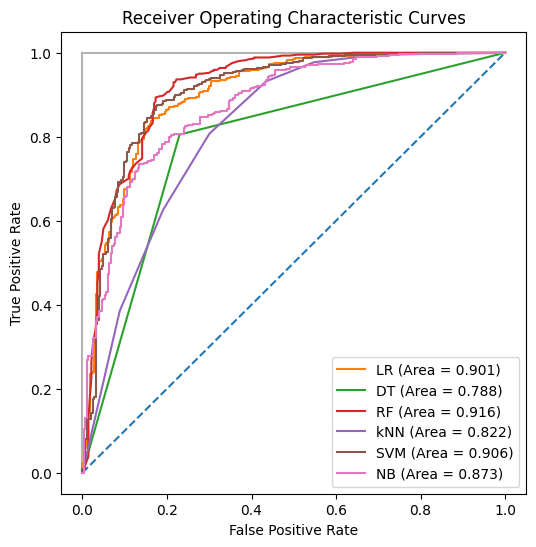

In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot

plt.figure(figsize=(6,6))
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7")
plt.plot([1, 1] , c=".7")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic Curves')

model_list = [LR_model,decision_tree,random_forest,knn,svm,naive_bayes]
model_abb = ["LR", "DT", "RF", "kNN", "SVM", "NB"]
i = 0
for model in model_list:
    # predict probabilities
    yhat = model.predict_proba(selected_X_test)
    # keep probabilities for the positive outcome only
    pos_probs = yhat[:, 1]
    # calculate roc curves
    false_positive_rate, true_positive_rate, threshold = roc_curve(y_test, pos_probs,pos_label= "Graduate")
    # plot the roc curves
    plt.plot(false_positive_rate, true_positive_rate, label = model_abb[i] + ' (Area = %0.3f)' % roc_auc_score(y_test, pos_probs))
    pyplot.legend(loc = "lower right")
    # move on to next model
    i += 1
pyplot.show()

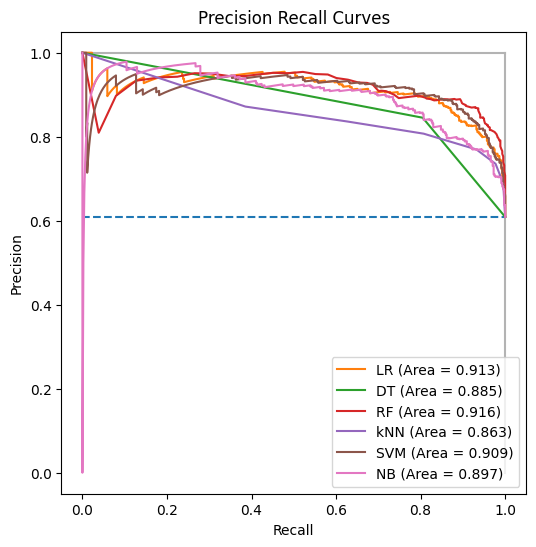

In [ ]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import auc
from matplotlib import pyplot

plt.figure(figsize=(6,6))
plt.plot([0, 1], [len(y_test[y_test=='Graduate']) / len(y_test), len(y_test[y_test=='Graduate']) / len(y_test)], ls="--")
plt.plot([0, 1], [1, 1] , c=".7")
plt.plot([1, 1], [1, 0], c=".7")
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision Recall Curves')

model_list = [LR_model,decision_tree,random_forest,knn,svm,naive_bayes]
model_abb = ["LR", "DT", "RF", "kNN", "SVM","NB"]
i = 0
for model in model_list:
    # predict probabilities
    yhat = model.predict_proba(selected_X_test)
    # keep probabilities for the positive outcome only
    pos_probs = yhat[:, 1]
    # predict class values
    precision, recall, _ = precision_recall_curve(y_test, pos_probs,pos_label= "Graduate")
    # plot precision-recall curves
    plt.plot(recall, precision, label = model_abb[i] + ' (Area = %0.3f)' % auc(recall, precision))
    pyplot.legend(loc = "lower right")
    # move on to next model
    i += 1
pyplot.show()

By observing both graphs, all lines are well above the random guessing score line (dotted line). This means all models are better than random guessing. Nearly all curves have areas under the curve (AUC) higher than 80%. Logistic Regression (LR), Random Forest (RF) and Support Vector Machine (SVM) have higher areas under curves than the other three models, with RF having the highest AUC for both ROC and PR Curves.

**5.4 Summary of Model Evaluation**

In [ ]:
# Summary of performance for each model
from sklearn.metrics import accuracy_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import auc

model_list = [LR_model,decision_tree,random_forest,knn,svm,naive_bayes]
model_pred = [LRpredictions,decision_tree_predictions,random_forest_predictions,knn_predictions,svm_predictions,naive_bayes_predictions]
model_name = ["Logistic Regression (LR)",
              "Decision Tree (DT)",
              "Random Forest (RF)",
              "k-Nearest Neighbour (kNN)",
              "Support Vector Machine (SVM)",
              "Naive Bayes (NB)"]
i = 0
Sacc = []
Spcs = []
Srec = []
Sspec = []
Sf1s = []
Sroauc = []
Sprauc = []

for model in model_list:
    yhat = model.predict_proba(selected_X_test)
    pos_probs = yhat[:, 1]
    # Obtain accuracy
    acc = accuracy_score(y_test, model_pred[i])
    # Obtain precision
    pcs = precision_score(y_test, model_pred[i], pos_label= "Graduate")
    # Obtain recall/sensitivity/true positive rate
    rec = recall_score(y_test, model_pred[i], pos_label= "Graduate")
    # Obtain specitivity/true negative rate
    spec = recall_score(y_test, model_pred[i], pos_label= "Dropout")
    # Obtain F1-score
    f1s = f1_score(y_test, model_pred[i], pos_label= "Graduate")
    # Obtain ROC-AUC score
    roauc = roc_auc_score(y_test, pos_probs)
    # Obtain PR-AUC score
    precision, recall, _ = precision_recall_curve(y_test, pos_probs, pos_label= "Graduate")
    prauc = auc(recall, precision)
    # Append each score for each model
    Sacc.append(acc)
    Spcs.append(pcs)
    Srec.append(rec)
    Sspec.append(spec)
    Sf1s.append(f1s)
    Sroauc.append(roauc)
    Sprauc.append(prauc)
    # Move on to next model
    i += 1

# Construct a data frame that consists of all performance for all model
eva_summary=pd.DataFrame({'Model': model_name,
                          'Accuracy': Sacc,
                          'Precision': Spcs,
                          'Recall/Sensitivity': Srec,
                          'Specitivity' : Sspec,
                          'F1-Score': Sf1s,
                          'ROC-AUC Score': Sroauc,
                          'PR-AUC Score': Sprauc})
eva_summary

,Model,Accuracy,Precision,Recall/Sensitivity,Specitivity,F1-Score,ROC-AUC Score,PR-AUC Score
0,Logistic Regression (LR),0.831492,0.826176,0.916100,0.699647,0.868817,0.901236,0.913492
1,Decision Tree (DT),0.791436,0.845238,0.804989,0.770318,0.824623,0.787653,0.884506
2,Random Forest (RF),0.868785,0.869658,0.922902,0.784452,0.895490,0.916068,0.916308
3,k-Nearest Neighbour (kNN),0.765193,0.807256,0.807256,0.699647,0.807256,0.821599,0.863477
4,Support Vector Machine (SVM),0.837017,0.814815,0.947846,0.664311,0.876310,0.905956,0.909229
5,Naive Bayes (NB),0.792818,0.815618,0.852608,0.699647,0.833703,0.873489,0.897486


The table above consists of all evaluation metrics applied for all trained models in this study. Out of the seven metrics listed, Random Forest has ranked first for six of them, with the exception of Recall, where it ranked second. Hence, it is safe to conclude that the Random Forest model is the best model among all six models.

Logistic Regression and Support Vector Machine outperformed Decision Tree, k-Nearest Neighbour and Naive Bayes in terms of accuracy, recall, F1-score and both AUC scores. Hence, Logistic Regression and Support Vector Machine are better models than the other three models.

Cost-benefit analysis can be used to assess the cost of implementing the model in the future. Random Forest, Logistic Regression and Support Vector Machine may undergo further hyperparameter optimisation to improve the model’s performance. Since this dataset has imbalanced class for the target, Synthetic Minority Over-sampling Technique (SMOTE), which is a widely used algorithm for synthetic training sample generation may be applied. For the base model, the Random Forest is good enough to predict the outcome of the student’s performance.


# 6.   Deployment

The models trained in this notebook are saved for further usage. By saving the trained models, we can reuse them in the future without retraining. Loading the models allows us to deploy them in applications for making predictions on new data.

The following code demonstrates the process of saving and loading trained models.


In [ ]:
# Save trained models in local
from joblib import dump
model_list = [LR_model,decision_tree,random_forest,knn,svm,naive_bayes]
file_LR = "C:\\Users\\User\\Documents\\Python Scripts\\7003GP\\LR_model.jlib"
file_DT = "C:\\Users\\User\\Documents\\Python Scripts\\7003GP\\decision_tree.joblib"
file_RF = "C:\\Users\\User\\Documents\\Python Scripts\\7003GP\\random_forest.jlib"
file_knn = "C:\\Users\\User\\Documents\\Python Scripts\\7003GP\\knn.jlib"
file_svm = "C:\\Users\\User\\Documents\\Python Scripts\\7003GP\\svm.jlib"
file_nb = "C:\\Users\\User\\Documents\\Python Scripts\\7003GP\\naive_bayes.jlib"
file_list = [file_LR,file_DT,file_RF,file_knn,file_svm,file_nb]

i = 0
for model in model_list:
  dump(model,file_list[i])
  i += 1

In [ ]:
# Load trained models in local
from joblib import load
LR_model = load("C:\\Users\\User\\Documents\\Python Scripts\\7003GP\\LR_model.jlib")
decision_tree = load("C:\\Users\\User\\Documents\\Python Scripts\\7003GP\\decision_tree.jlib")
random_forest = load("C:\\Users\\User\\Documents\\Python Scripts\\7003GP\\random_forest.jlib")
knn = load("C:\\Users\\User\\Documents\\Python Scripts\\7003GP\\knn.jlib")
svm = load("C:\\Users\\User\\Documents\\Python Scripts\\7003GP\\svm.jlib")
naive_bayes = load("C:\\Users\\User\\Documents\\Python Scripts\\7003GP\\naive_bayes.jlib")

This notebook also will be stored in Google Drive for future use.

**6.1 Plan for Future Deployment**

The current result is not satisfying enough as the highest true dropout rate (specificity) is below 80%, this means there is quite a portion of students that actually have a high risk of dropout but are predicted to graduate. Hence the current model is not up to standard yet to be deployed to the public.

As mentioned in Section 5.4, the hyperparameter optimization can be applied to the best three base models to achieve better performance. Our target is to train at least one model that is able to reach at least 90% for all evaluation metrics before the model can be deployed to the end user. An online prediction application can be constructed on the Streamlit website.

The dataset is describing the situation at a university in Portugal. As there is a different passing requirement for each subject for every university or country, there is a chance that the model deployed is not applicable to the environment in Malaysia. Hence, we plan to cooperate with a stakeholder or an advisor from an educational background in the future so that the model can be applied to Malaysia.

Once the final product is deployed, we hope that the application can successfully detect the students that have a high risk of being dropout so that the related parties can provide early intervention to the students. Continuous maintenance and improvement of the application will be executed via end-user suggestions.



# 7.   References

Hotz, N. (2023, January 19). What is CRISP DM? Data Science Process Alliance. Retrieved April 26, 2023, from     https://www.datascience-pm.com/crisp-dm-2/

Realinho,Valentim, Vieira Martins,Mónica, Machado,Jorge & Baptista,Luís. (2021). Predict students' dropout and academic success. UCI Machine Learning Repository. https://archive-beta.ics.uci.edu/dataset/697/predict+students+dropout+and+academic+success.

# 8.   Members' Contribution

*   Chan Jie Min (s2141167) - Business & Data Understanding
*   Timothy Chen Xian Yii (22056170) - Data Preparation
*   Emily Sia Zi Xuan (17205326) - Data Modelling
*   Ang Qi Kang (17205824) - Data Modelling
*   Chen Yi (22079565) - Data Evaluation & Deployment